## Load package 

In [1]:

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import torch
import ot
from sklearn.datasets import make_moons
import os
os.chdir("..")

from lib.unbalanced_gromov_wasserstein.unbalancedgw.vanilla_ugw_solver import exp_ugw_sinkhorn,log_ugw_sinkhorn
from lib.unbalanced_gromov_wasserstein.unbalancedgw._vanilla_utils import ugw_cost
from lib.unbalanced_gromov_wasserstein.unbalancedgw.utils import generate_measure
from lib.unbalanced_gromov_wasserstein.unbalancedgw.batch_stable_ugw_solver import log_batch_ugw_sinkhorn
from lib.gromov import gromov_wasserstein, cost_matrix_d, partial_gromov_ver1, GW_dist, MPGW_dist, PGW_dist_with_penalty,partial_gromov_wasserstein

## load data generated functions

In [3]:

def rotation_2d(theta=0):
    return np.array([[np.cos(theta), -np.sin(theta)],
                    [np.sin(theta), np.cos(theta)]
    ])


def make_yinyang_2d(N,r=1,var=0.0001,eta=0.2,theta=0.9*np.pi,beta=[1.5,-1],low=-2,high=-1):
    X = []
    c = []

    for _ in range(N):
        while True:
            x = np.random.uniform(-r, r)
            y = np.random.uniform(-r, r)

            if x**2 + y**2 <= r**2:
                if y >= 0: c_ = 0
                else: c_ = 1

                if y >= 0 and (x + r/2)**2 + y**2 <= (r/2)**2:
                    c_ = 1 - c_
                elif y < 0 and (x - r/2)**2 + y**2 <= (r/2)**2:
                    c_ = 1 - c_

                x += np.random.normal(0, var)
                y += np.random.normal(0, var)

                X.append([x, y])
                c.append(c_)
                break

    X,c = np.array(X), np.array(c)
    
    X1=X[c==0]
    X2=X[c==1]
    X2=X2.dot(rotation_2d(theta))+beta
    outliers = np.random.uniform(low=low, high=high, size=(int(N*eta), 2))
    return X1, X2, outliers

flip_M=np.array([[0,1],[1,0]])

def make_moon_2d(N=200, eta=0.10, ns=0.2,theta=0,beta=0,low=-3,high=-2,random_state=0):
    X, y = make_moons(n_samples=2*N, noise=ns,random_state=random_state)
    
    X1=X[y==0]
    X2=X[y==1]
    X2=X2.dot(rotation_2d(theta)).dot(flip_M)
    X2=X2+beta
    N=X1.shape[0]
    #outlier_idx = np.random.choice(np.where(y == 0)[0], int(N*eta))
    outliers = np.random.uniform(low=low, high=high, size=(int(N*eta), 2))
    return X1, X2,outliers

def make_3d_sphere(N=200, eta=0.2, d_min=0.5,low=-3,high=-2,random_state=0):
    circle = (np.linspace(0,2*np.pi,N+1)[0:N]).reshape((N,1)) #np.random.uniform(low=0, high=2*np.pi, size=(N, 1))
    circle = np.hstack((np.cos(circle), np.sin(circle)))
    np.random.seed(random_state)
    k=int(np.sqrt(N))
    n_remains=N-k**2
    
    angles =np.random.uniform([0,0],[np.pi,2*np.pi],(N,2))
#    phi   = np.linspace(0,np.pi,k+1)[0:k]
#    theta = np.linspace(0,2*np.pi,k+1)[0:k]
#    phi,theta=np.meshgrid(phi,theta)
#    phi,theta=phi.reshape(-1),theta.reshape(-1)
    
#    phi_1 = np.random.uniform(0, np.pi, n_remains)
#    theta_1 = np.random.uniform(0, 2*np.pi, n_remains)
    phi = angles[:,0]  #np.concatenate((phi,phi_1))
    
    theta = angles[:,1] # np.concatenate((theta,theta_1))
    
    x = np.sin(phi) * np.cos(theta)
    y = np.sin(phi) * np.sin(theta)
    z = np.cos(phi)

    sphere = np.stack((x, y, z), axis=1) 
    
    sphere += np.array([0, 0, 4])
    
    n_outliers = int(N*eta)
    #outliers = sphere[np.random.choice(sphere.shape[0], n_outliers, replace=True)]
    outliers = np.random.uniform(low=low, high=high, size=(n_outliers,2))
    
    
    return sphere, circle, outliers  

# def plot_2d(X1, X2):
#     plt.figure(figsize=(8, 6))
#     plt.scatter(X[y == 0, 0], X[y == 0, 1], c='r', s=20)
#     plt.scatter(X[y == 1, 0], X[y == 1, 1], c='b', s=20)
#     plt.scatter(X[y == 2, 0], X[y == 2, 1], c='c', s=20)
#     plt.xticks([])
#     plt.yticks([])
#     plt.show()

#@nb.njit(fastmath=True)
def generate_d_square(d,n):
    x_list=[]
    for i in range(d):
        x = np.linspace(-1, 1, n)
        x_list.append(x)
    xx= np.meshgrid(*x_list,indexing='ij')
    data=np.zeros((n**d,d))
    for i in range(d):
        data[:,i]=xx[i].reshape(-1)
    return data



def make_3d_square(k=2, eta=0.2, d_min=0.5,low=-3,high=-2):
    N=k**(2*3)
    square=generate_d_square(2,k**3)
    cubic=generate_d_square(3,k**2)
    
    cubic += np.array([0, 0, 4])
    
    n_outliers = int(N*eta)

    outliers = np.random.uniform(low=low, high=high, size=(n_outliers,2))
    
    
    return cubic,square, outliers  


def plot_2d(X1, X2):
    plt.figure(figsize=(8, 6))
    plt.scatter(X1[:,0], X1[:,1], c='r', s=20)
    plt.scatter(X2[:,0], X2[:, 1], c='b', s=20)
    #plt.scatter(X[y == 2, 0], X[y == 2, 1], c='c', s=20)
    #plt.xticks([])
    #plt.yticks([])
    plt.show()



# def plot_3d(X1, X2, labels):
#     fig = plt.figure(figsize=(8, 8))
#     ax = fig.add_subplot(111, projection='3d')
    
#     ax.scatter(circle[:, 0], circle[:, 1], circle[:, 2], c='r', s=20)
#     ax.scatter(sphere[labels == 0, 0], sphere[labels == 0, 1], sphere[labels == 0, 2], c='b', s=20)
#     ax.scatter(sphere[labels == 1, 0], sphere[labels == 1, 1], sphere[labels == 1, 2], c='c', s=20)
    
#     ax.set_box_aspect([1,1,1])
#     ax.view_init(elev=20, azim=45)
#     plt.tight_layout()
    
#     plt.show()
    
def get_cost_matrices(X, Y):
    C1 = cost_matrix_d(X, X)
    C2 = cost_matrix_d(Y, Y)
    return C1, C2


def plot_plan_2d(X, Y, gamma,threshold=1e-8):
    plt.figure(figsize=(8, 6))
    N=X.shape[0]
    plt.scatter(X[:,0], X[:, 1], c='r')
    
    plt.scatter(Y[0:N,0], Y[0:N,1], c='c')
    plt.scatter(Y[N+1:,0],  Y[N+1:,1], c='b')
    
    for i in range(X.shape[0]):
        for j in range(Y.shape[0]):
            if gamma[i, j] > threshold:  plt.plot([X[i, 0], Y[j, 0]], [X[i, 1], Y[j, 1]], 'grey', lw=gamma[i, j]*150, alpha=0.4)

    plt.show()

def embed_3d(X):
    N,d=X.shape
    if d<3:
        X1=np.zeros((N,3))
        X1[:,0:d]=X
    else:
        X1=X.copy()
    return X1

def plot_3d(X, Y, gamma=None,threshold=1e-5,title=None):   
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, projection='3d')
    X,Y=embed_3d(X),embed_3d(Y)
    N=X.shape[0]
    ax.scatter(X[:, 0], X[:, 1], X[:, 2], c='r')
    ax.scatter(Y[:N, 0], Y[:N, 1], Y[:N, 2], c='c')
    ax.scatter(Y[N+1:, 0], Y[N+1:, 1], Y[N+1:, 2], c='b')
    ax.axis('off')
    ax.set_facecolor('white') 
    ax.view_init(10, 90,0)
    if gamma is not None:
        for i in range(X.shape[0]):
            for j in range(Y.shape[0]):
                if gamma[i, j] > threshold:  ax.plot([X[i, 0], Y[j, 0]], [X[i, 1], Y[j, 1]], [X[i, 2], Y[j, 2]], 'grey', lw=gamma[i, j]*150,alpha=0.4)
    ax.set_xlim([-1,1])
    ax.set_ylim([-1,1])
    ax.set_zlim([1,3.8])
    if title is not None:
        ax.set_title(title,fontsize=20)

    plt.show()

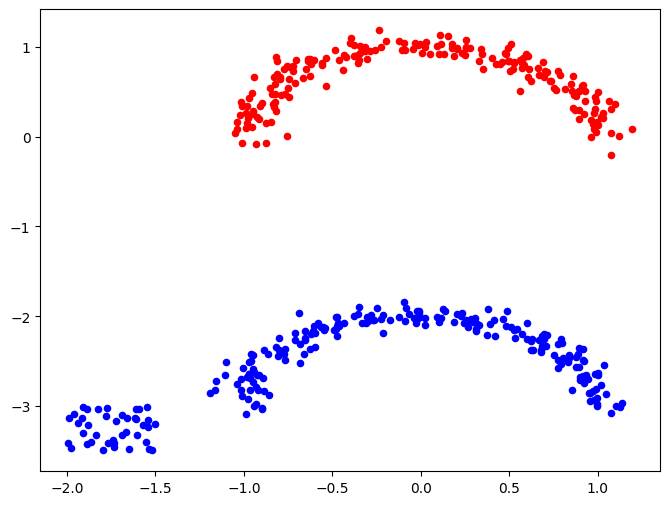

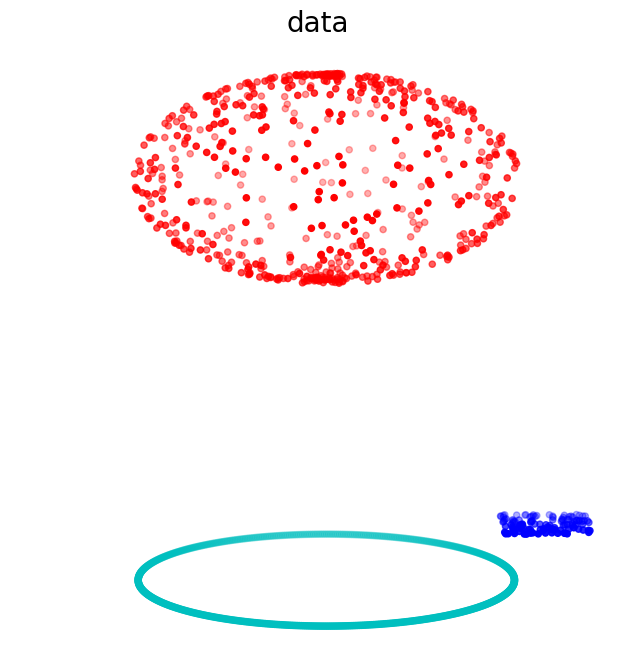

600


In [4]:
# generate moon data and sphere-circle data 


X1,X2,outliers = make_moon_2d(N=200,eta=0.20,ns=0.08,theta=-1/2*np.pi,beta=[-1,-2.5],low=[-2,-3.5],high=[-1.5,-3],random_state=4)
X2=np.vstack((X2,outliers))

plot_2d(X1,X2)


X1c,X2c,outliers = make_3d_sphere(N=600, eta=0.2, d_min=0.5,low=[-1.5,-1.5],high=[-1,-1],random_state=0) #(N=200,eta=0.20,theta=0.9*np.pi,beta=[1,-2],low=,high=)
X2c=np.vstack((X2c,outliers))

plot_3d(X1c,X2c,title='data')

print(X1c.shape[0])


# circle, sphere, labels_3d = make_3d()
#plot_3d(circle, sphere, labels_3d)

PGW lambda=0.01: transport cost=0.0, penalty=0.024399999999999995, distance=0.024399999999999995


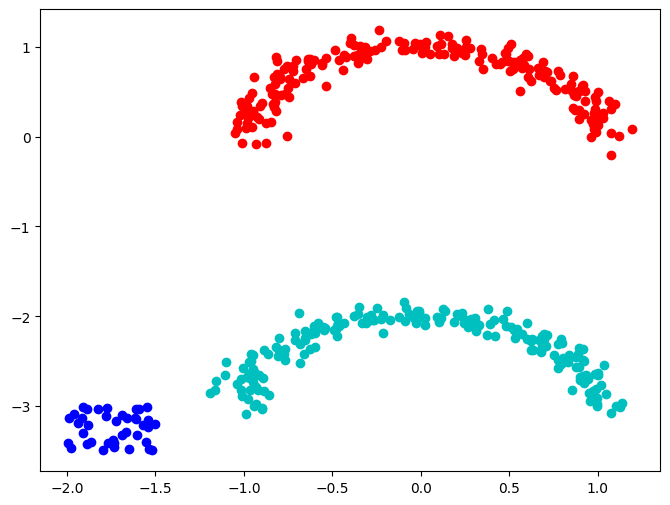

PGW lambda=0.1: transport cost=0.017699714050341157, penalty=0.04798, distance=0.06567971405034116


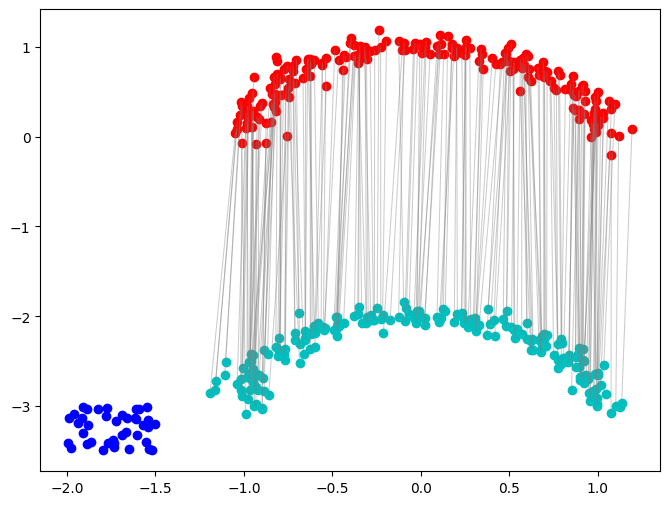

PGW lambda=1.0: transport cost=0.021260761434701944, penalty=0.4400000000000004, distance=0.46126076143470235


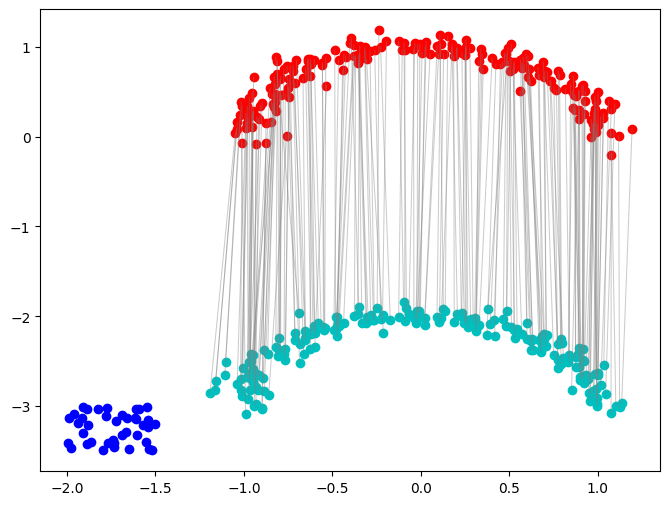

PGW lambda=10: transport cost=0.021260761434701944, penalty=4.400000000000004, distance=4.421260761434706


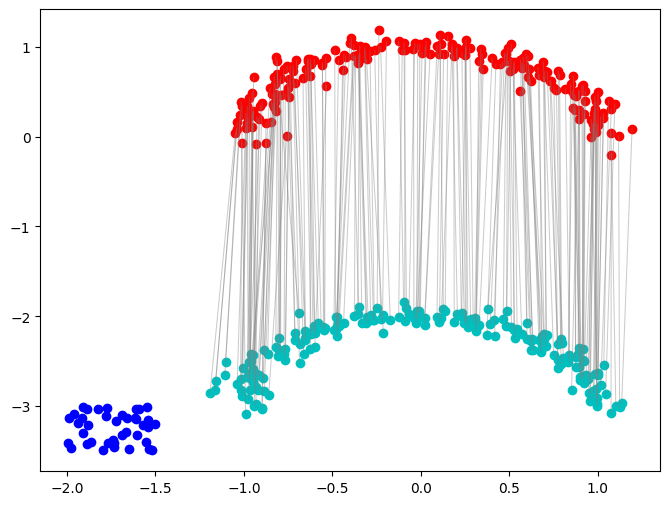

mPGW m=0.3: transport cost=0.021260761434701944, penalty=4.400000000000004, distance=4.421260761434706


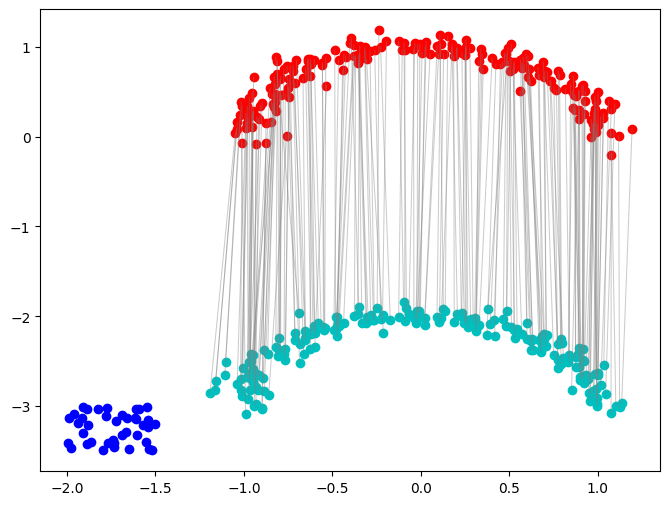

mPGW m=0.5: transport cost=0.021260761434701944, penalty=4.400000000000004, distance=4.421260761434706


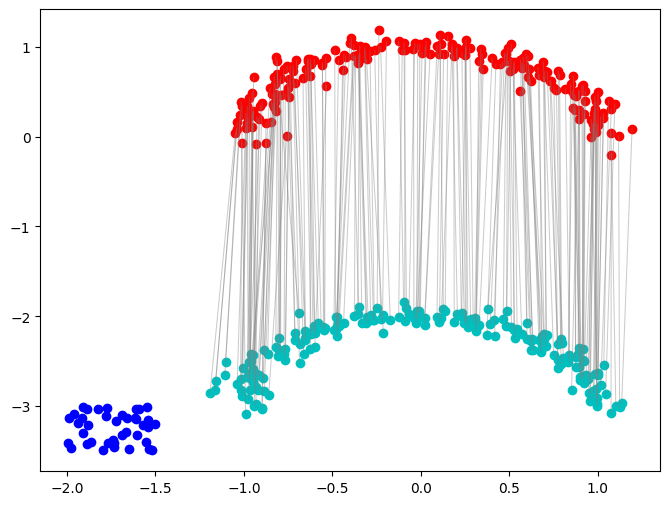

mPGW m=0.8: transport cost=0.021260761434701944, penalty=4.400000000000004, distance=4.421260761434706


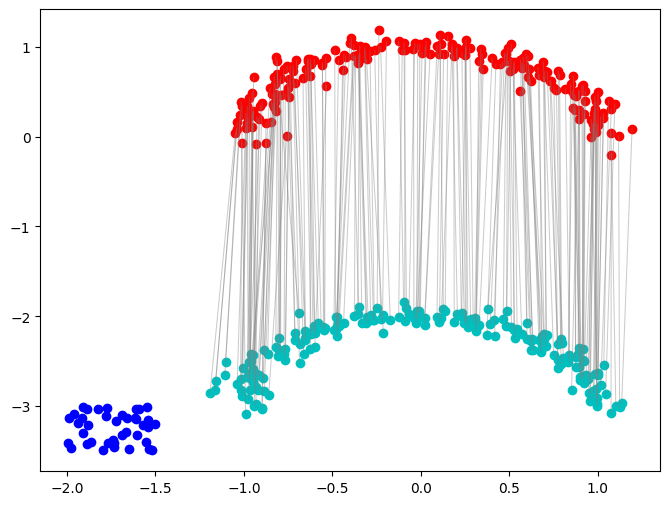

mPGW m=0.9999999999999998: transport cost=0.021260761434701944, penalty=4.400000000000004, distance=4.421260761434706


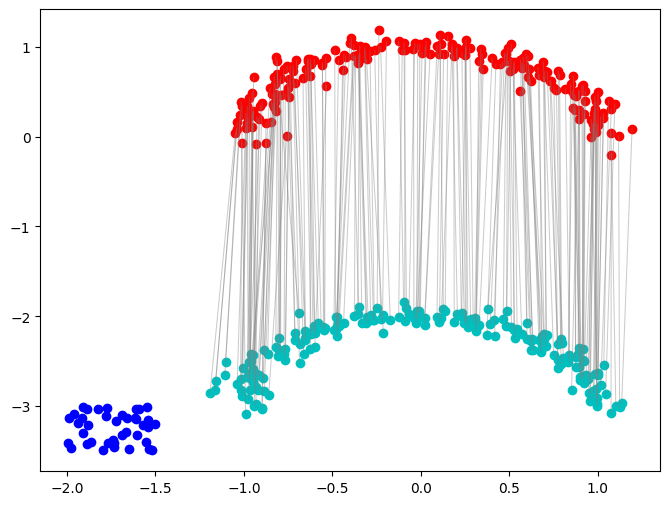

UGW rho=0.01: cost=0.09477000683546066


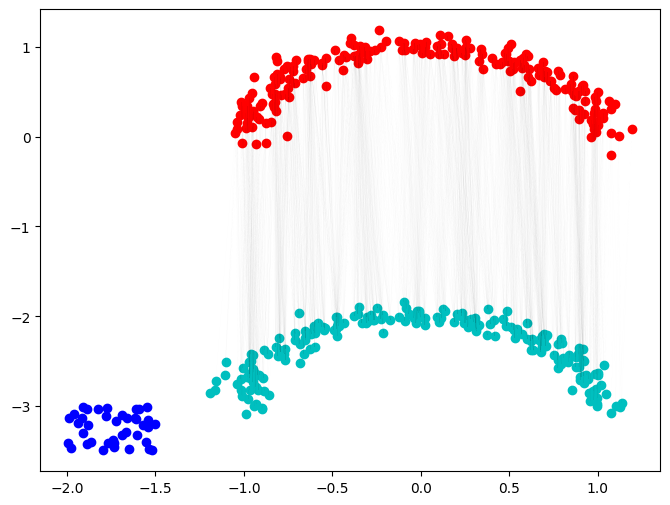

UGW rho=0.1: cost=0.23155349493026733


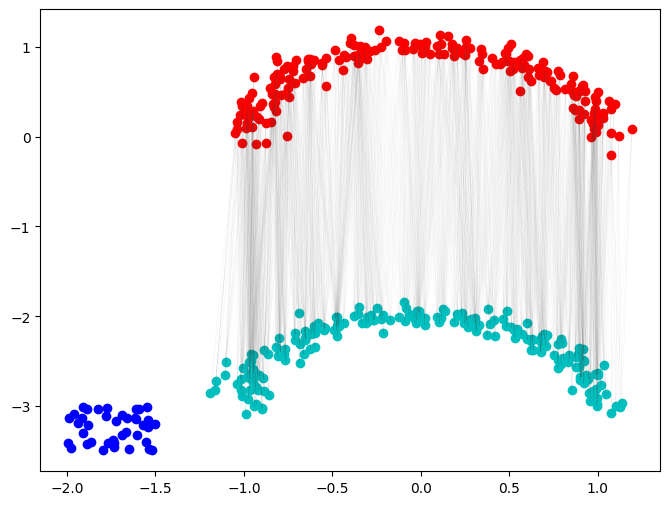

UGW rho=1.0: cost=0.7151123285293579


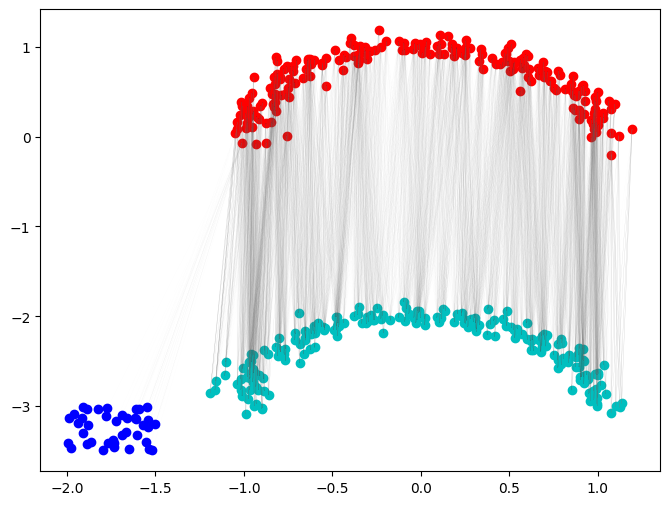

UGW rho=10: cost=2.495026111602783


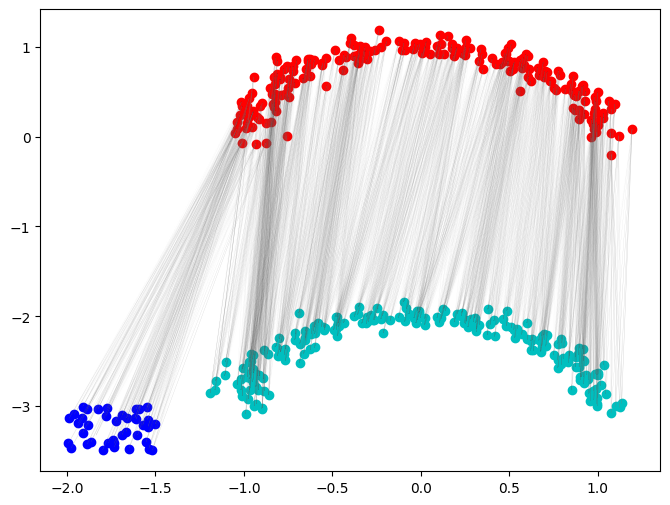

GW : 2.27822648777994


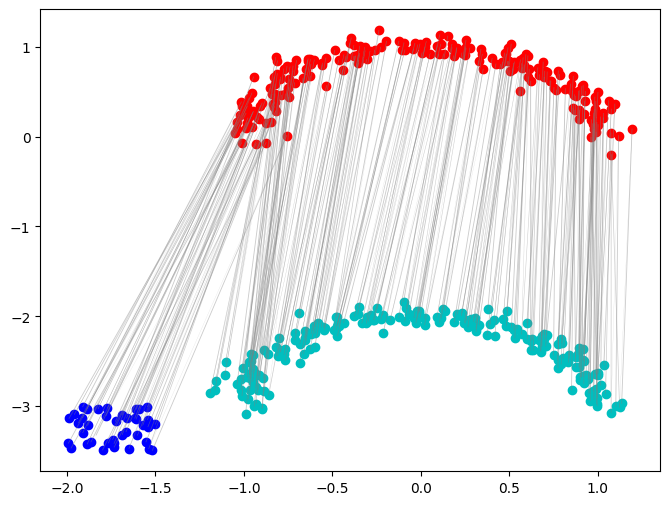

In [169]:
# apply all methods for moon data 

C1,C2=cost_matrix_d(X1,X1),cost_matrix_d(X2,X2)

#PGW
lams = [1e-2, 1e-1, 1e0, 10]
pgw_list,mpgw_list,ugw_list,gw_list=[],[],[],[]
C12=cost_matrix_d(X1,X2)

N1,N2=X1.shape[0],X2.shape[0]
    
p = np.ones(N1) / N1
q = np.ones(N2) / N1

G0=ot.emd(p/p.sum(),q/q.sum(),C12)
for lam in lams:
    #X_src = X_2d[y_2d != 0]  
    #y_src = y_2d[y_2d != 0]
    #X_tar = X_2d[y_2d == 0]  
    
    N1,N2=X1.shape[0],X2.shape[0]
        
    p = np.ones(N1) / N1
    q = np.ones(N2) / N1
    gamma = partial_gromov_ver1(C1, C2, p, q, G0=G0, Lambda=lam, thres=1, numItermax=100*N1, tol=1e-5, log=False, verbose=False, line_search=True)
    pgw_trans, pgw_penalty = PGW_dist_with_penalty(C1, C2, gamma, p, q, lam)
    pgw_D = pgw_trans + pgw_penalty
    
    print(f'PGW lambda={lam}: transport cost={pgw_trans}, penalty={pgw_penalty}, distance={pgw_D}')
    
    plot_plan_2d(X1, X2, gamma, threshold=1e-5)
    pgw_list.append(gamma)
    

for mass in [0.3, 0.5,0.8, min(p.sum(),q.sum())]:
    N1,N2=X1.shape[0],X2.shape[0]

    p = np.ones(N1) / N1
    q = np.ones(N2) / N1
    gamma = partial_gromov_wasserstein(C1, C2, p, q, G0=G0, m=min(p.sum(),q.sum()), thres=1, numItermax=100*N1, tol=1e-5, log=False, verbose=False, line_search=False)
    mpgw_list.append(gamma)
    print(f'mPGW m={mass}: transport cost={pgw_trans}, penalty={pgw_penalty}, distance={pgw_D}')
    plot_plan_2d(X1, X2, gamma, threshold=1e-5)



rhos = [1e-2, 1e-1, 1e0, 10]
for rho in rhos:
#     X_src = X_2d[y_2d == 0]
#     y_src = y_2d[y_2d != 0]
#     X_tar = X_2d[y_2d == 0]
    
    p = np.ones(X1.shape[0]) / N1
    q = np.ones(X2.shape[0]) / N1
    C1, C2 = cost_matrix_d(X1,X1),cost_matrix_d(X2,X2)
    eps = 0.05
    Cx = torch.from_numpy(C1).to(torch.float32)
    Cy = torch.from_numpy(C2).to(torch.float32)
    mu = torch.from_numpy(p).to(torch.float32)
    nu = torch.from_numpy(q).to(torch.float32)
    G0_torch=torch.from_numpy(G0).to(torch.float32)
    
    gamma = log_batch_ugw_sinkhorn(mu.unsqueeze(0), Cx.unsqueeze(0), nu.unsqueeze(0), Cy.unsqueeze(0), init=G0_torch.unsqueeze(0), eps=eps, rho=rho, rho2=rho, nits_plan=3000, tol_plan=1e-5, nits_sinkhorn=3000, tol_sinkhorn=1e-6)
    gamma = gamma.squeeze().detach().cpu().numpy()
    ugw_list.append(gamma)
    ugw_cost_value = ugw_cost(torch.tensor(gamma), torch.tensor(gamma), mu, Cx, nu, Cy, eps=eps, rho=rho, rho2=rho)
    
    print(f'UGW rho={rho}: cost={ugw_cost_value}')
    plot_plan_2d(X1, X2, gamma, threshold=1e-5)


#GW

p = np.ones(X1.shape[0]) / N1
q = np.ones(X2.shape[0]) / N2
C1, C2 = cost_matrix_d(X1,X1),cost_matrix_d(X2,X2)
gamma = gromov_wasserstein(C1, C2, p, q, G0=G0, thres=1, numItermax=100*N1, tol=1e-5, log=False, verbose=False, line_search=False)
gw_list.append(gamma)
gw_dist = GW_dist(C1, C2, gamma)
print(f'GW : {gw_dist}')
plot_plan_2d(X1, X2, gamma, threshold=1e-5)


np.savez("shape_matching/results/gammas_2d.npz", pgw_list=pgw_list, mpgw_list=mpgw_list, ugw_list=ugw_list, gw_list=gw_list)



PGW lambda=0.01: transport cost=0.0, penalty=0.0244, distance=0.0244


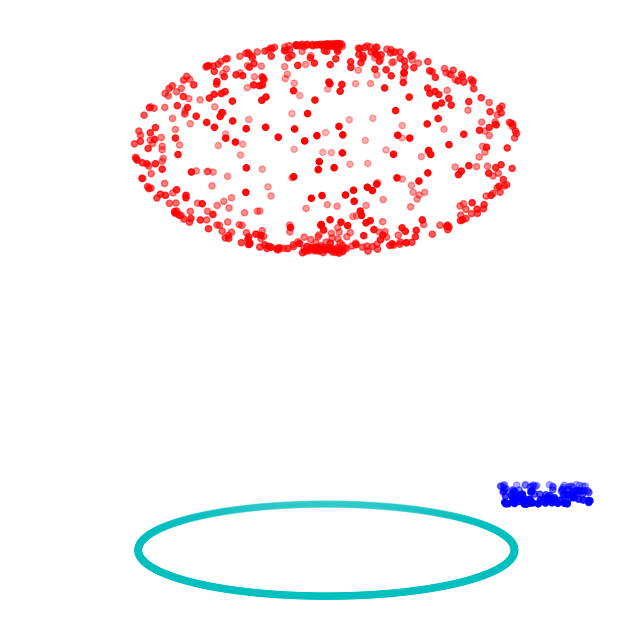

PGW lambda=0.1: transport cost=0.0, penalty=0.244, distance=0.244


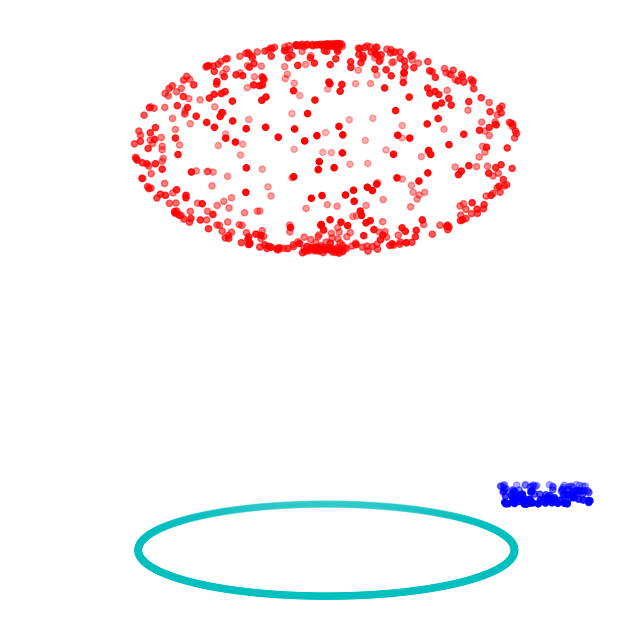

PGW lambda=1.0: transport cost=0.4194479230531781, penalty=0.5775499999999996, distance=0.9969979230531776


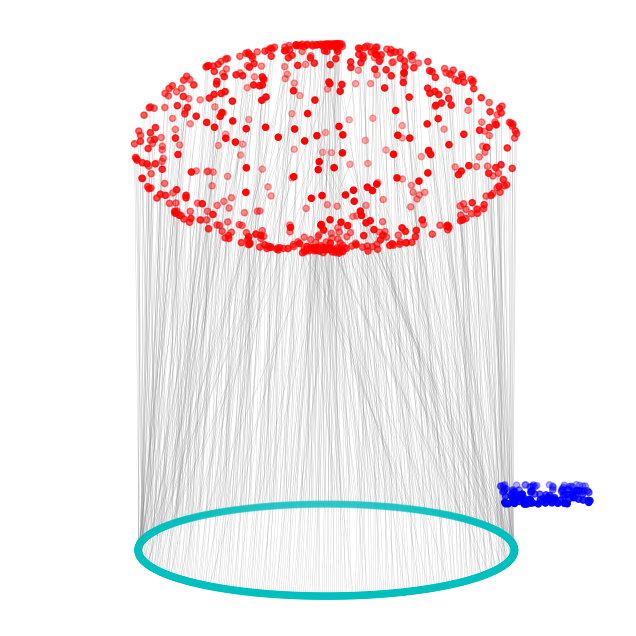

PGW lambda=10: transport cost=0.5803522392253555, penalty=4.400000000000008, distance=4.980352239225364


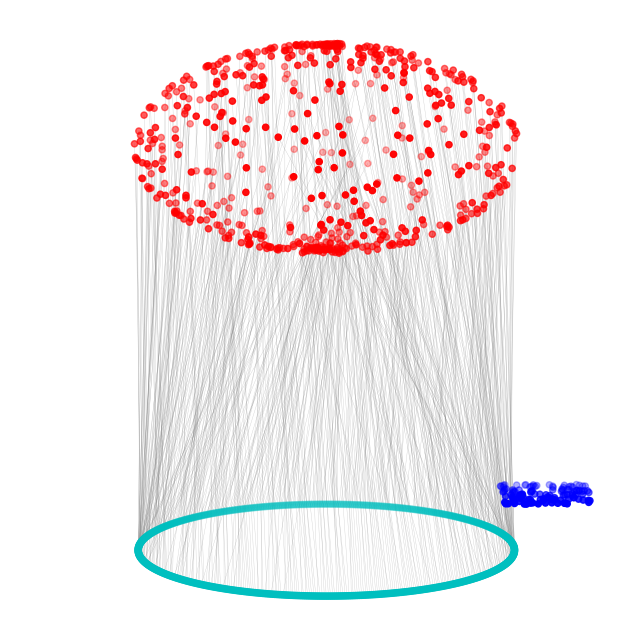

mPGW m=0.3: transport cost=0.5803522392253555, penalty=4.400000000000008, distance=4.980352239225364


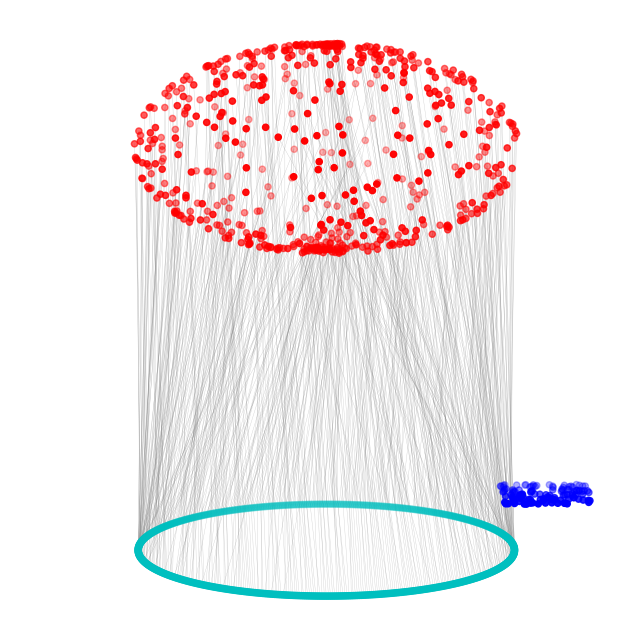

mPGW m=0.5: transport cost=0.5803522392253555, penalty=4.400000000000008, distance=4.980352239225364


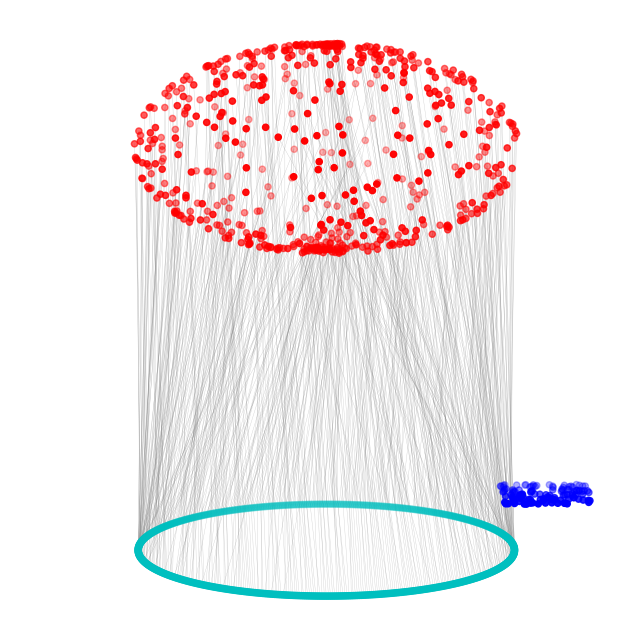

mPGW m=0.8: transport cost=0.5803522392253555, penalty=4.400000000000008, distance=4.980352239225364


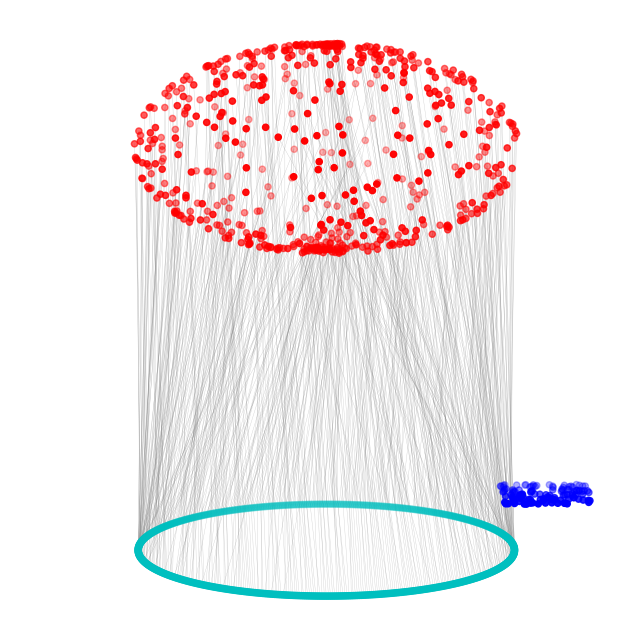

mPGW m=1.0: transport cost=0.5803522392253555, penalty=4.400000000000008, distance=4.980352239225364


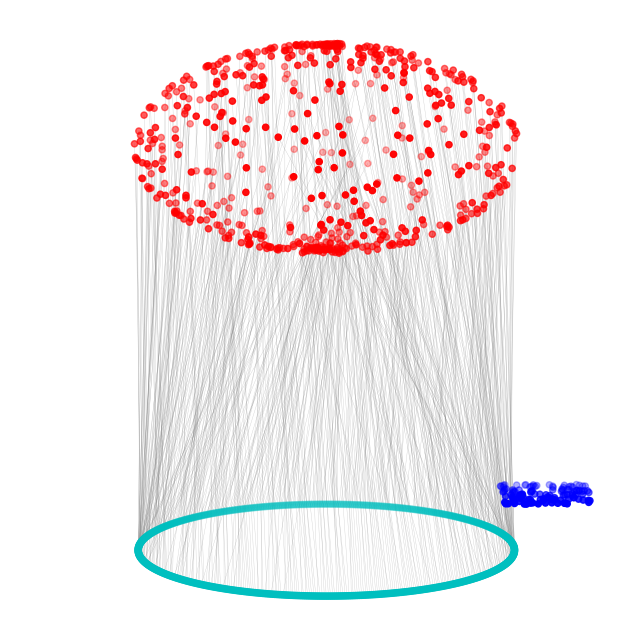

UGW rho=0.01: cost=0.09600436687469482


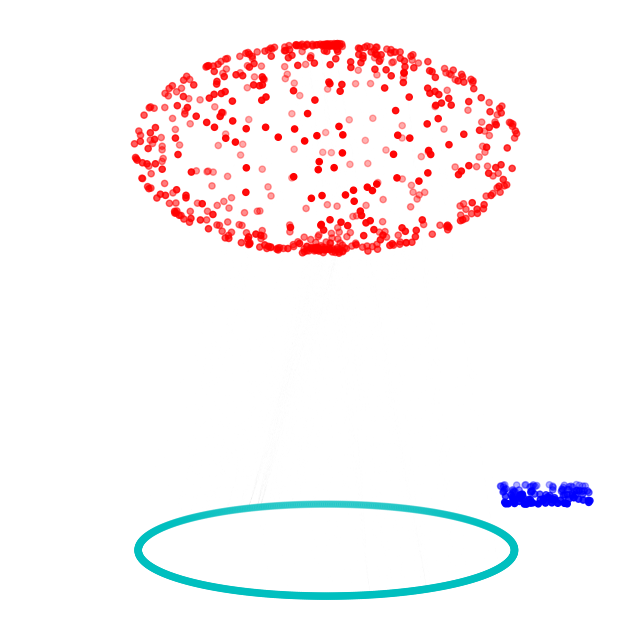

UGW rho=0.1: cost=0.2741219103336334


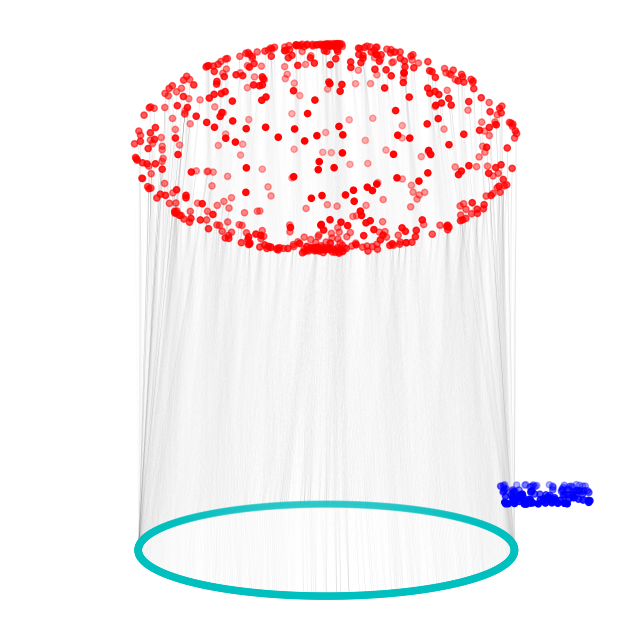

UGW rho=1.0: cost=1.0298131704330444


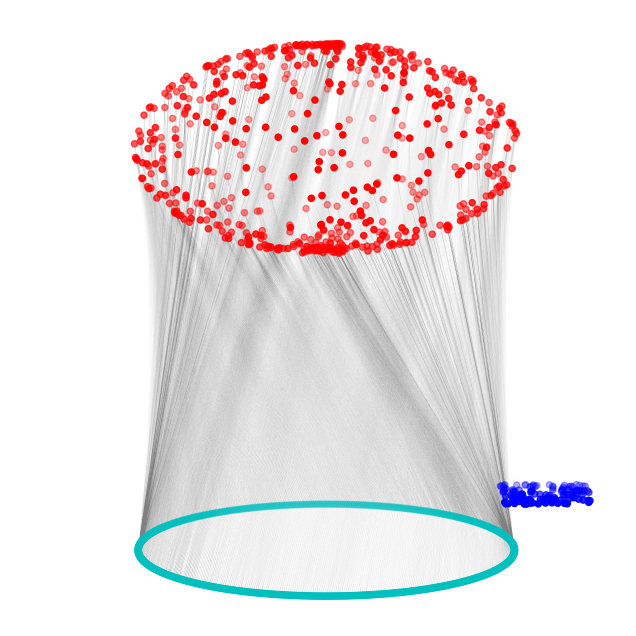

UGW rho=10: cost=2.749382734298706


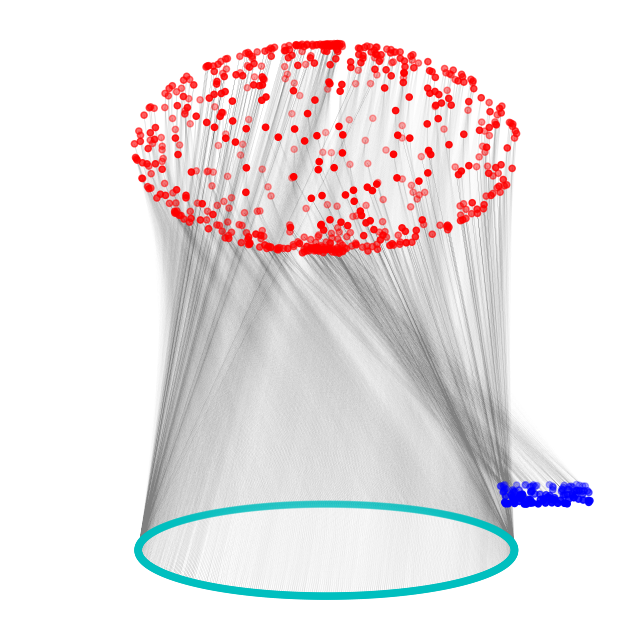

GW : 2.048354904837393


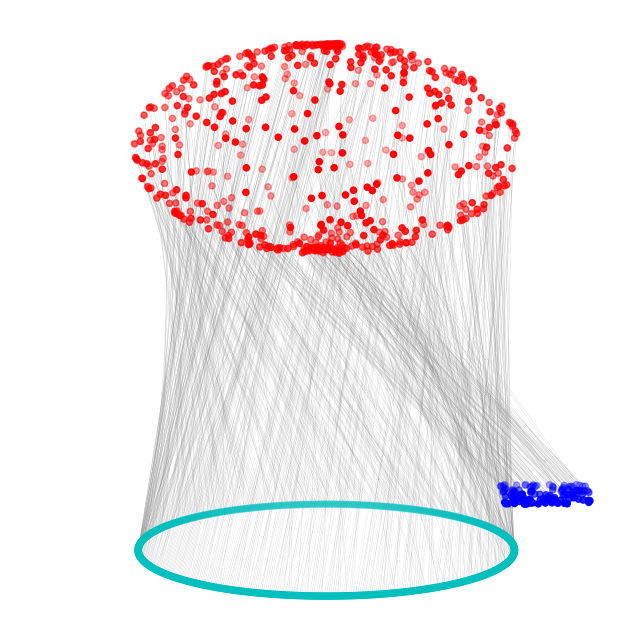

In [164]:
# apply all methods for circle-sphere data 
C1,C2=cost_matrix_d(X1c,X1c),cost_matrix_d(X2c,X2c)
N1,N2=C1.shape[0],C2.shape[0]
p = np.ones(N1) / N1
q = np.ones(N2) / N1
X2c_3d=np.zeros((N2,3))
X2c_3d[:,0:2]=X2c
C=cost_matrix_d(X1c,X2c_3d)
G0=ot.emd(p/p.sum(),q/q.sum(),C)


#PGW
lams = [1e-2, 1e-1, 1e0, 10]
pgw_list,mpgw_list,ugw_list,gw_list=[],[],[],[]
for lam in lams:
    p = np.ones(N1) / N1
    q = np.ones(N2) / N1
    gamma = partial_gromov_ver1(C1, C2, p, q, G0=G0, Lambda=lam, thres=1, numItermax=100*N1, tol=1e-5, log=False, verbose=False, line_search=True)
    pgw_trans, pgw_penalty = PGW_dist_with_penalty(C1, C2, gamma, p, q, lam)
    pgw_D = pgw_trans + pgw_penalty
    print(f'PGW lambda={lam}: transport cost={pgw_trans}, penalty={pgw_penalty}, distance={pgw_D}')
    
    plot_3d(X1c, X2c, gamma, threshold=1e-5)
    pgw_list.append(gamma)
    

for mass in [0.3,0.5,0.8, min(p.sum(),q.sum())]:
    p = np.ones(N1) / N1
    q = np.ones(N2) / N1
    gamma = partial_gromov_wasserstein(C1, C2, p, q, G0=G0, m=min(p.sum(),q.sum()), thres=1, numItermax=100*N1, tol=1e-5, log=False, verbose=False, line_search=False)
    mpgw_list.append(gamma)
    print(f'mPGW m={mass}: transport cost={pgw_trans}, penalty={pgw_penalty}, distance={pgw_D}')
    plot_3d(X1c, X2c, gamma, threshold=1e-5)



rhos = [1e-2, 1e-1, 1e0, 10]
for rho in rhos:    
    eps = 0.05
    Cx = torch.from_numpy(C1).to(torch.float32)
    Cy = torch.from_numpy(C2).to(torch.float32)
    mu = torch.from_numpy(p).to(torch.float32)
    nu = torch.from_numpy(q).to(torch.float32)
    G0_torch=torch.from_numpy(G0).to(torch.float32)
    gamma = log_batch_ugw_sinkhorn(mu.unsqueeze(0), Cx.unsqueeze(0), nu.unsqueeze(0), Cy.unsqueeze(0), init=G0_torch.unsqueeze(0), eps=eps, rho=rho, rho2=rho, nits_plan=3000, tol_plan=1e-5, nits_sinkhorn=3000, tol_sinkhorn=1e-6)
    gamma = gamma.squeeze().detach().cpu().numpy()
    ugw_list.append(gamma)
    ugw_cost_value = ugw_cost(torch.tensor(gamma), torch.tensor(gamma), mu, Cx, nu, Cy, eps=eps, rho=rho, rho2=rho)
    
    print(f'UGW rho={rho}: cost={ugw_cost_value}')
    plot_3d(X1c, X2c, gamma, threshold=1e-6)


#GW

p = np.ones(N1) / N1
q = np.ones(N2) / N2
gamma = gromov_wasserstein(C1, C2, p, q, G0=G0, thres=1, numItermax=100*N1, tol=1e-5, log=False, verbose=False, line_search=False)
gw_list.append(gamma)
gw_dist = GW_dist(C1, C2, gamma)
print(f'GW : {gw_dist}')
plot_3d(X1c, X2c, gamma, threshold=1e-5)

np.savez("shape_matching/results/gammas_3d.npz", pgw_list=pgw_list, mpgw_list=mpgw_list, ugw_list=ugw_list, gw_list=gw_list)



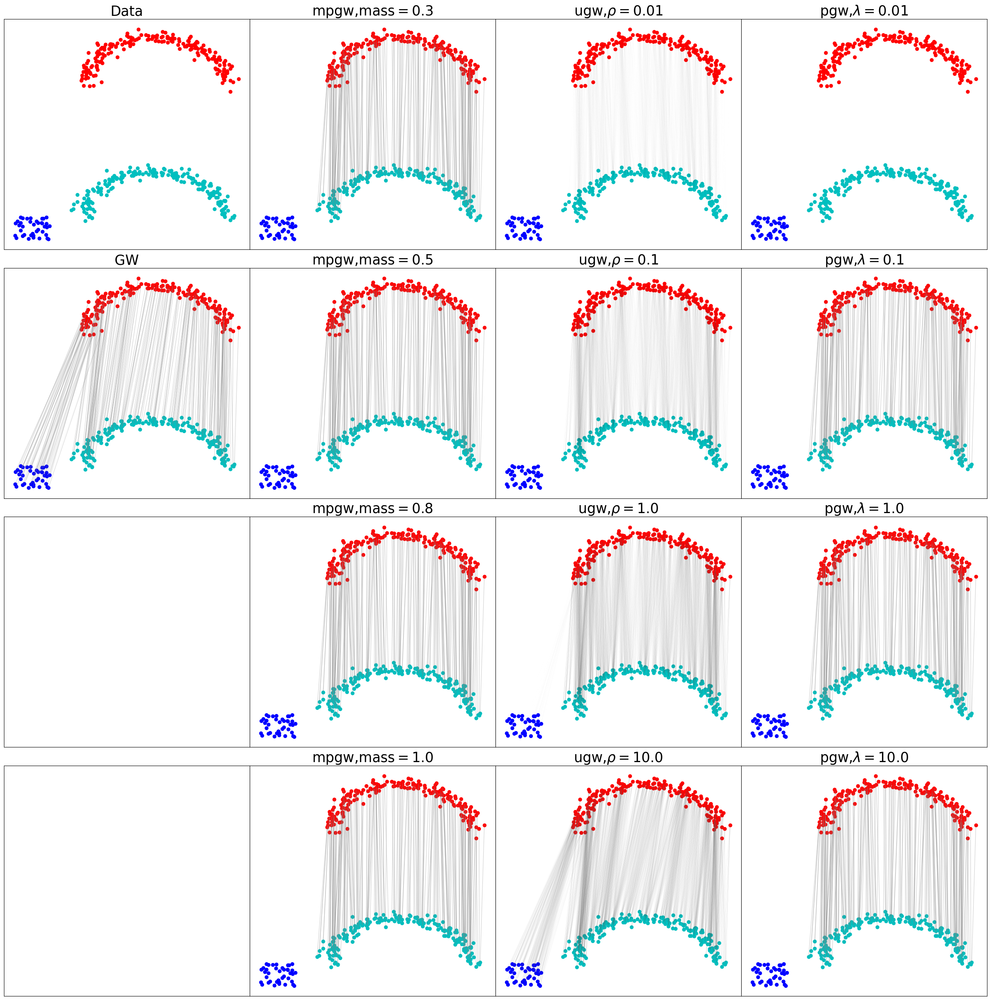

In [170]:
import torch
import numpy as np
import matplotlib.pyplot as plt

# Define method list and set up figure
method_list = ['gw', 'mpgw', 'ugw', 'pgw']
fig, ax = plt.subplots(4, 4, figsize=(8*4, 8*4))
threshold = 1e-5

# Titles and labels
# xlabel_list = ['Data', 'GW', 'MPGW (mass=0.3,0.5,0.8,1.0)', 'UGW ($\\rho$=0.01,0.1,1.0,10.0)', 'PGW ($\\lambda$=0.01,0.1,1.0,1.0)']
# for j, label in enumerate(xlabel_list):
#     ax[0, j].set_title(label, fontsize=30)

# First column: Data
N = X1.shape[0]
i=0

ax[i, 0].scatter(X1[:, 0], X1[:, 1], c='r')
ax[i, 0].scatter(X2[0:N, 0], X2[0:N, 1], c='c')
ax[i, 0].scatter(X2[N+1:, 0], X2[N+1:, 1], c='b')
ax[i, 0].set_xticks([])
ax[i, 0].set_yticks([])
ax[i, 0].set_title('Data', fontsize=25)

i=1    


result_2d = np.load('shape_matching/results/gammas_2d.npz')
gamma_gw = result_2d['gw_list'][0]  # Using the single available result for GW

ax[i, 0].scatter(X1[:, 0], X1[:, 1], c='r')
ax[i, 0].scatter(X2[0:N, 0], X2[0:N, 1], c='c')
ax[i, 0].scatter(X2[N+1:, 0], X2[N+1:, 1], c='b')
for i1 in range(X1.shape[0]):
    for j1 in range(X2.shape[0]):
        if gamma_gw[i1, j1] > threshold:
            ax[i, 0].plot([X1[i1, 0], X2[j1, 0]], [X1[i1, 1], X2[j1, 1]], 'grey', lw=gamma_gw[i1, j1]*150, alpha=0.4)
ax[i, 0].set_xticks([])
ax[i, 0].set_yticks([])
ax[i, 0].set_title('GW', fontsize=25)

for i in range(1,4):
    ax[i, 0].set_xticks([])
    ax[i, 0].set_yticks([])
    

mass_values = [0.3, 0.5, 0.8, 1.0]
lambda_values=[0.01,0.1,1.0,10.0]
rho_values=[0.01,0.1,1.0,10.0]
params=[r'mass',r'$\rho$',r'$\lambda$']

method_list2=['mpgw','ugw','pgw']
for j,(method, param,param_name) in enumerate(zip(method_list2,[mass_values,rho_values,lambda_values],params)):
    j+=1
    for i, param_value in enumerate(param):
        gamma = result_2d[method+'_list'][i]
        
        ax[i, j].scatter(X1[:, 0], X1[:, 1], c='r')
        ax[i, j].scatter(X2[0:N, 0], X2[0:N, 1], c='c')
        ax[i, j].scatter(X2[N+1:, 0], X2[N+1:, 1], c='b')
        if method != 'ugw':
            threshold=1e-5
        else:
            threshold=1e-6
        for i1 in range(X1.shape[0]):
            for j1 in range(X2.shape[0]):
                if gamma[i1, j1] > threshold:
                    ax[i, j].plot([X1[i1, 0], X2[j1, 0]], [X1[i1, 1], X2[j1, 1]], 'grey', lw=gamma[i1, j1]*150, alpha=0.4)
        ax[i, j].set_xticks([])
        ax[i, j].set_yticks([])
        ax[i, j].set_title(method+','+param_name+r'$=$'+ f"{param_value}", fontsize=25)


# Save and display
plt.subplots_adjust(wspace=0, hspace=0.08)  
plt.savefig('shape_matching/results/shape_match_full_2d.png', dpi=200, bbox_inches='tight')
plt.show()


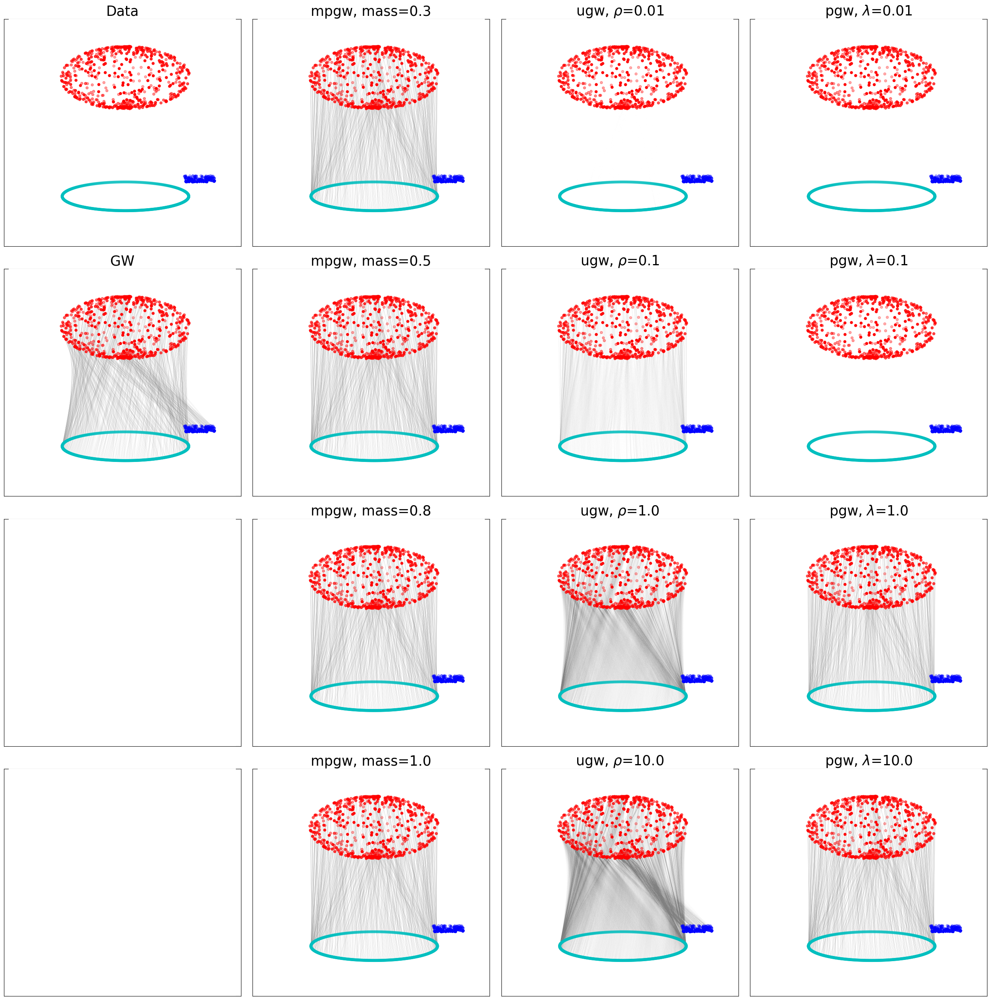

In [176]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Plot 3D result
X1c_3d = embed_3d(X1c)
X2c_3d = embed_3d(X2c)

# Define method list and set up figure
fig, ax = plt.subplots(4, 4, figsize=(8*4, 8*4))
threshold = 1e-5

# Load results
result_3d = np.load('shape_matching/results/gammas_3d.npz')

X1c_3d = embed_3d(X1c)
X2c_3d = embed_3d(X2c)
N=X1c_3d.shape[0]
# Create the 4x4 grid of 3D subplots
for i in range(4):
    for j in range(4):
        ax[i, j].set_xticks([])
        ax[i, j].set_yticks([])
        #ax[i, j].axis('off')
    
        index = 4 * i + j + 1
        ax[i, j] = fig.add_subplot(4, 4, index, projection='3d')
        ax[i, j].view_init(elev=10, azim=90)
        ax[i, j].set_xticks([])
        ax[i, j].set_yticks([])
        ax[i, j].set_zticks([])
        ax[i, j].set_facecolor('white')
        ax[i, j].axis('off')
        ax[i,j].set_xlim([-1.1, 1.1])
        ax[i,j].set_ylim([-1.1, 1.1])
        ax[i,j].set_zlim([0.5, 4.0])
        if not(j==0 and i>=2): 
            ax[i, j].scatter(X1c_3d[:, 0], X1c_3d[:, 1], X1c_3d[:, 2], c='r')
            ax[i, j].scatter(X2c_3d[0:N, 0], X2c_3d[0:N, 1], X2c_3d[0:N, 2], c='c')
            ax[i, j].scatter(X2c_3d[N+1:, 0], X2c_3d[N+1:, 1], X2c_3d[N+1:, 2], c='b')
        
        


i=0
ax[i, 0].set_title('Data', fontsize=25)
i=1 
gamma = result_3d['gw_list'][0]

for i1 in range(X1c_3d.shape[0]):
    for j1 in range(X2c_3d.shape[0]):
        if gamma[i1, j1] > threshold:
            ax[i, 0].plot([X1c_3d[i1, 0], X2c_3d[j1, 0]], 
                          [X1c_3d[i1, 1], X2c_3d[j1, 1]], 
                          [X1c_3d[i1, 2], X2c_3d[j1, 2]], 
                          color='grey', lw=gamma[i1, j1]*150, alpha=0.4)

ax[i, 0].set_title('GW', fontsize=25)
for j, (method, param, param_name) in enumerate(zip(method_list2, [mass_values, rho_values, lambda_values], params), start=1):
    for i, param_value in enumerate(param):
        gamma = result_3d[method + '_list'][i]
        
        threshold = 1e-6 if method == 'ugw' else 1e-5
        for i1 in range(X1c_3d.shape[0]):
            for j1 in range(X2c_3d.shape[0]):
                if gamma[i1, j1] > threshold:
                    ax[i, j].plot([X1c_3d[i1, 0], X2c_3d[j1, 0]], 
                                  [X1c_3d[i1, 1], X2c_3d[j1, 1]], 
                                  [X1c_3d[i1, 2], X2c_3d[j1, 2]], 
                                  color='grey', lw=gamma[i1, j1]*150, alpha=0.4)
        
        ax[i, j].set_title(f"{method}, {param_name}={param_value}", fontsize=25)




        






# Adjust subplot spacing and save the figure
#plt.tight_layout(pad=0)
plt.subplots_adjust(wspace=0.05, hspace=0.1)  # Further reduce spacing
plt.savefig('shape_matching/results/shape_match_full_3d.png', dpi=200, bbox_inches='tight')
plt.show()


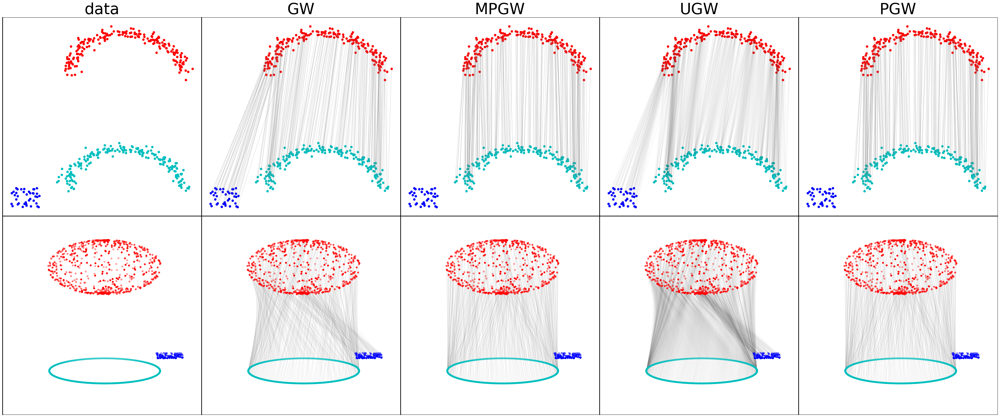

In [85]:
import torch
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

method_list = ['gw', 'mpgw', 'ugw', 'pgw']
fig, ax = plt.subplots(2, 5, figsize=(40, 16))
threshold = 1e-5

# Initial 2D subplot settings
for j in range(5):
    ax[0, j].set_xticks([])
    ax[0, j].set_yticks([])
    ax[1, j].set_xticks([])
    ax[1, j].set_yticks([])

# Plotting initial 2D scatter plots
N=X1.shape[0]
ax[0, 0].scatter(X1[:, 0], X1[:, 1], c='r')
ax[0, 0].scatter(X2[0:N, 0], X2[0:N, 1], c='c')
ax[0, 0].scatter(X2[N+1:, 0], X2[N+1:, 1], c='b')

# Plot 2D result
result = np.load('shape_matching/results/gammas_2d.npz')
method_idx_list = [-1, -1, -1, -1]

for j, (method, method_idx) in enumerate(zip(method_list, method_idx_list)):
    j+=1
    gamma = result[method+'_list'][method_idx]
    if method == 'ugw':
        threshold = 1e-6
    else:
        threshold = 1e-5
    
    ax[0, j].scatter(X1[:, 0], X1[:, 1], c='r')
    ax[0, j].scatter(X2[0:N, 0], X2[0:N, 1], c='c')
    ax[0, j].scatter(X2[N+1:, 0], X2[N+1:, 1], c='b')
    for i1 in range(X1.shape[0]):
        for j1 in range(X2.shape[0]):
            if gamma[i1, j1] > threshold:
                ax[0, j].plot([X1[i1, 0], X2[j1, 0]], [X1[i1, 1], X2[j1, 1]], 'grey', lw=gamma[i1, j1]*150, alpha=0.4)

# Plot 3D result
X1c_3d = embed_3d(X1c)
X2c_3d = embed_3d(X2c)
N=X1c_3d.shape[0]
for j in range(5):
    ax[1, j] = fig.add_subplot(2, 5, j + 6, projection='3d')
    ax[1, j].view_init(10, 90, 0)
    ax[1, j].set_xticks([])
    ax[1, j].set_yticks([])
    ax[1, j].set_zticks([])
    ax[1, j].set_facecolor('white')
    ax[1, j].axis('off')
    ax[1,j].set_xlim([-1.1, 1.1])
    ax[1,j].set_ylim([-1.1, 1.1])
    ax[1,j].set_zlim([0.5, 4.0])


j=0
ax[1, j].scatter(X1c_3d[:, 0],    X1c_3d[:, 1],    X1c_3d[:, 2], c='r')
ax[1, j].scatter(X2c_3d[0:N, 0],  X2c_3d[0:N, 1],  X2c_3d[0:N, 2], c='c')
ax[1, j].scatter(X2c_3d[N+1:, 0], X2c_3d[N+1:, 1], X2c_3d[N+1:, 2], c='b')


result = np.load('shape_matching/results/gammas_3d.npz')
method_idx_list = [-1, -1, -1, -1]

for j, (method, method_idx) in enumerate(zip(method_list, method_idx_list)):
    j+=1
    
    gamma = result[method+'_list'][method_idx]
    ax[1, j].scatter(X1c_3d[:, 0],    X1c_3d[:, 1],    X1c_3d[:, 2], c='r')
    ax[1, j].scatter(X2c_3d[0:N, 0],  X2c_3d[0:N, 1],  X2c_3d[0:N, 2], c='c')
    ax[1, j].scatter(X2c_3d[N+1:, 0], X2c_3d[N+1:, 1], X2c_3d[N+1:, 2], c='b')
    ax[1, j].set_facecolor('white')
    for i1 in range(X1c.shape[0]):
        for j1 in range(X2c.shape[0]):
            if gamma[i1, j1] > threshold:
                ax[1, j].plot([X1c_3d[i1, 0], X2c_3d[j1, 0]], [X1c_3d[i1, 1], X2c_3d[j1, 1]], [X1c_3d[i1, 2], X2c_3d[j1, 2]],
                              'grey', lw=gamma[i1, j1]*150, alpha=0.4)


# Add boundary line between the first and second rows
line = plt.Line2D([0, 1], [0.5, 0.5], transform=fig.transFigure, color="black", linewidth=2)


fig.add_artist(line)
for i in range(5):
    line2 = plt.Line2D([0.2*i, 0.2*i], [0, 1.0], transform=fig.transFigure, color="black", linewidth=2)
    fig.add_artist(line2)
plt.tight_layout(pad=0.0)

xlabel_list=['data','GW','MPGW','UGW','PGW']
for j,label in enumerate(xlabel_list):
    ax[0, j].set_title(label, fontsize=45)
    
plt.savefig('shape_matching/shape_match.png', dpi=200, bbox_inches='tight')
plt.savefig('shape_matching/shape_match.jpg', dpi=200, bbox_inches='tight')

plt.show()


2D, N is 200
3D, N is 600


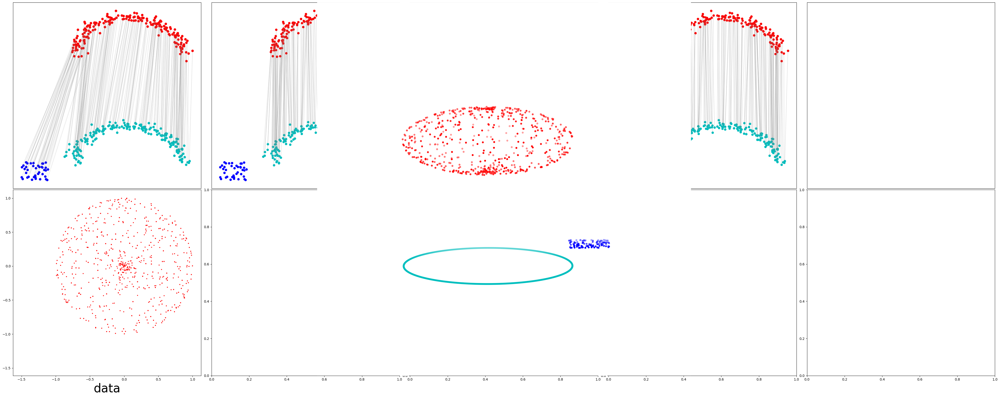

In [109]:
method_list=['gw','mpgw','ugw','pgw'] #['pgw'],result['mpgw'],result['ugw'],result['gw']
fig, ax = plt.subplots(2, 5, figsize=(40, 16))
threshold=1e-5
N=X1.shape[0]
print('2D, N is',N)
i=0
for j in range(5):
    ax[i,j].set_xticks([])
    ax[i,j].set_yticks([])

ax[0,0].scatter(X1[:,0], X1[:, 1], c='r')
ax[0,0].scatter(X2[0:N,0], X2[0:N,1], c='c')
ax[0,0].scatter(X2[N+1:,0],  X2[N+1:,1], c='b')


# plot 2D result: 
i=0 
result=np.load('shape_matching/results/gammas_2d.npz')
method_idx_list=[-1,-1,-1,-1]

for j,(method,method_idx) in enumerate(zip(method_list,method_idx_list)):
    gamma=result[method+'_list'][method_idx]

    if method=='ugw':
        threshold=1e-6
    else:
        threshold=1e-5
    ax[i,j].scatter(X1[:,0], X1[:, 1], c='r')
    
    ax[i,j].scatter(X2[0:N,0], X2[0:N,1], c='c')
    ax[i,j].scatter(X2[N+1:,0],  X2[N+1:,1], c='b')
    for i1 in range(X1.shape[0]):
        for j1 in range(X2.shape[0]):
            if gamma[i1, j1] > threshold:  ax[i,j].plot([X1[i1, 0], X2[j1, 0]], [X1[i1, 1], X2[j1, 1]], 'grey', lw=gamma[i1, j1]*150, alpha=0.4)

# plot 3D result
i=1 

N=X1c_3d.shape[0]
print('3D, N is',N)
X1c_3d=embed_3d(X1c)
X2c_3d=embed_3d(X2c)
ax[i,0].scatter(X1c_3d[:,0],   X1c_3d[:, 1],   X1c_3d[:,2],    c='r')
ax[i,0].scatter(X2c_3d[0:N,0], X2c_3d[0:N,1],  X2c_3d[0:N,2],  c='c')
ax[i,0].scatter(X2c_3d[N+1:,0],X2c_3d[N+1:,1], X2c_3d[N+1:,2], c='b')
ax[i,0].set_xlabel('data', fontsize=35)

result=np.load('shape_matching/results/gammas_3d.npz')
method_idx_list=[-1,-1,-1,-1]

for j,(method,method_idx) in enumerate(zip(method_list,method_idx_list)):
    ax[i,j] = fig.add_subplot(111, projection='3d')
    gamma=result[method+'_list'][method_idx]
    N=X1c_3d.shape[0]
    ax[i,j].scatter(X1c_3d[:,0], X1c_3d[:, 1],X1c_3d[:, 2], c='r')    
    ax[i,j].scatter(X2c_3d[0:N,0], X2c_3d[0:N,1],X2c_3d[0:N,2], c='c')
    ax[i,j].scatter(X2c_3d[N+1:,0], X2c_3d[N+1:,1],X2c_3d[N+1:,2], c='b')
    ax[i,j].set_xticks([])
    ax[i,j].set_yticks([])
    ax[i,j].set_zticks([])
    
    ax[i,j].axis('off')
    ax[i,j].set_facecolor('white') 
    ax[i,j].view_init(10, 90,0)
    
    ax[i,j].set_xlabel(method, fontsize=35)
    for i1 in range(X1c.shape[0]):
        for j1 in range(X2c.shape[0]):
            if gamma[i1, j1] > threshold:  
                ax[i,j].plot([X1c_3d[i1, 0], X2c_3d[j1, 0]], [X1c_3d[i1, 1], X2c_3d[j1, 1]],[X1c_3d[i1, 2], X2c_3d[j1, 2]], 'grey', lw=gamma[i, j]*150, alpha=0.4)
            
plt.tight_layout(pad=0.0)
plt.savefig('shape_matching/shape_match.png', dpi=200,bbox_inches='tight')
plt.savefig('shape_matching/shape_match.pdf', dpi=200,bbox_inches='tight')
    
plt.show()

In [ ]:
import torch
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

method_list = ['gw', 'mpgw', 'ugw', 'pgw']
fig, ax = plt.subplots(2, 5, figsize=(40, 16))
threshold = 1e-5

# Initial 2D subplot settings
for j in range(5):
    ax[0, j].set_xticks([])
    ax[0, j].set_yticks([])
    ax[1, j].set_xticks([])
    ax[1, j].set_yticks([])

# Plotting initial 2D scatter plots
ax[0, 0].scatter(X1[:, 0], X1[:, 1], c='r')
ax[0, 0].scatter(X2[0:N, 0], X2[0:N, 1], c='c')
ax[0, 0].scatter(X2[N+1:, 0], X2[N+1:, 1], c='b')

# Plot 2D result
result = torch.load('2d_shape_matching/result/gammas_2d.pt')
method_idx_list = [-1, -1, -1, -1]

for j, (method, method_idx) in enumerate(zip(method_list, method_idx_list)):
    j += 1
    gamma = result[method][method_idx]
    N = X1.shape[0]
    if method == 'ugw':
        threshold = 1e-6
    else:
        threshold = 1e-5
    
    ax[0, j].scatter(X1[:, 0], X1[:, 1], c='r')
    ax[0, j].scatter(X2[0:N, 0], X2[0:N, 1], c='c')
    ax[0, j].scatter(X2[N+1:, 0], X2[N+1:, 1], c='b')
    for i1 in range(X1.shape[0]):
        for j1 in range(X2.shape[0]):
            if gamma[i1, j1] > threshold:
                ax[0, j].plot([X1[i1, 0], X2[j1, 0]], [X1[i1, 1], X2[j1, 1]], 'grey', lw=gamma[i1, j1]*150, alpha=0.4)

# Plot 3D result
X1c_3d = embed_3d(X1c)
X2c_3d = embed_3d(X2c)
for j in range(5):
    ax[1, j] = fig.add_subplot(2, 5, j + 6, projection='3d')
    ax[1, j].view_init(10, 90, 0)
    ax[1, j].set_xticks([])
    ax[1, j].set_yticks([])
    ax[1, j].set_zticks([])
    ax[1, j].set_facecolor('white')
    ax[1, j].axis('off')

j = 0
ax[1, j].scatter(X1c_3d[:, 0], X1c_3d[:, 1], X1c_3d[:, 2], c='r')
ax[1, j].scatter(X2c_3d[0:N, 0], X2c_3d[0:N, 1], X2c_3d[0:N, 2], c='c')
ax[1, j].scatter(X2c_3d[N+1:, 0], X2c_3d[N+1:, 1], X2c_3d[N+1:, 2], c='b')

result = torch.load('2d_shape_matching/result/gammas_3d.pt')
method_idx_list = [-1, -1, -1, -1]

for j, (method, method_idx) in enumerate(zip(method_list, method_idx_list)):
    j += 1
    gamma = result[method][method_idx]
    N = X1.shape[0]
    ax[1, j].scatter(X1c_3d[:, 0], X1c_3d[:, 1], X1c_3d[:, 2], c='r')
    ax[1, j].scatter(X2c_3d[0:N, 0], X2c_3d[0:N, 1], X2c_3d[0:N, 2], c='c')
    ax[1, j].scatter(X2c_3d[N+1:, 0], X2c_3d[N+1:, 1], X2c_3d[N+1:, 2], c='b')
    ax[1, j].set_facecolor('white')

    ax[1, j].set_xlabel(method, fontsize=35)
    for i1 in range(X1c.shape[0]):
        for j1 in range(X2c.shape[0]):
            if gamma[i1, j1] > threshold:
                ax[1, j].plot([X1c_3d[i1, 0], X2c_3d[j1, 0]], [X1c_3d[i1, 1], X2c_3d[j1, 1]], [X1c_3d[i1, 2], X2c_3d[j1, 2]], 'grey', lw=gamma[i1, j1]*150, alpha=0.4)
    
    # Add boundary lines
    ax[1, j].plot([min(X1c_3d[:, 0]), max(X1c_3d[:, 0])], [min(X1c_3d[:, 1]), min(X1c_3d[:, 1])], [min(X1c_3d[:, 2]), min(X1c_3d[:, 2])], 'k-', linewidth=2)
    ax[1, j].plot([min(X1c_3d[:, 0]), max(X1c_3d[:, 0])], [max(X1c_3d[:, 1]), max(X1c_3d[:, 1])], [max(X1c_3d[:, 2]), max(X1c_3d[:, 2])], 'k-', linewidth=2)
    ax[1, j].plot([min(X1c_3d[:, 0]), min(X1c_3d[:, 0])], [min(X1c_3d[:, 1]), max(X1c_3d[:, 1])], [min(X1c_3d[:, 2]), max(X1c_3d[:, 2])], 'k-', linewidth=2)
    ax[1, j].plot([max(X1c_3d[:, 0]), max(X1c_3d[:, 0])], [min(X1c_3d[:, 1]), max(X1c_3d[:, 1])], [min(X1c_3d[:, 2]), max(X1c_3d[:, 2])], 'k-', linewidth=2)

plt.tight_layout(pad=0.0)
plt.savefig('2d_shape_matching/shape_match.png', dpi=200, bbox_inches='tight')
plt.savefig('2d_shape_matching/shape_match.pdf', dpi=200, bbox_inches='tight')

plt.show()


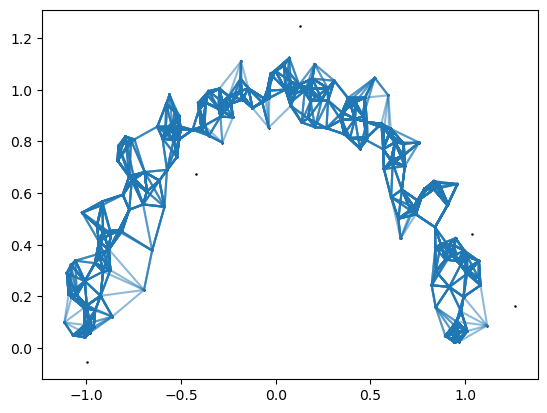

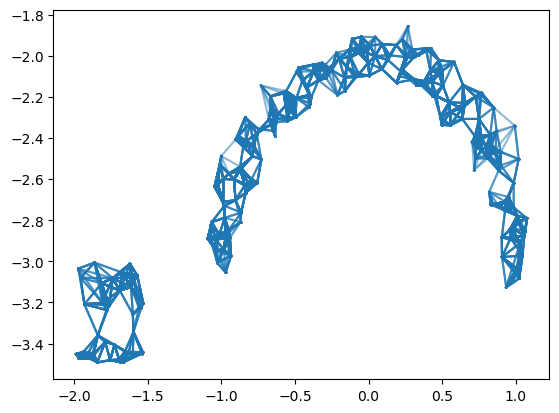

In [63]:
# test for graph distance 

import numpy as np
import matplotlib.pyplot as plt
import h5py
import seaborn as sns
import plotly
import plotly.express as px
import sklearn
import pandas as pd
import random
import tqdm

def vector_to_voxel(vector, shape=(16,16,16)):
    vec_shape = list(vector.shape[:-1]) + list(shape)
    voxel = vector.reshape(*vec_shape)
    return voxel

def voxel_to_pointcloud(voxel, num_points=None, shuffle=True):
    assert len(voxel.shape)==3, f"Voxel should be a 3D tensor. Given shape {voxel.shape}!=3"
    x, y, z = np.nonzero(voxel)
    point_cloud = np.concatenate([np.expand_dims(x,axis=1), np.expand_dims(y,axis=1), np.expand_dims(z,axis=1)], axis=1)
    if num_points is not None:
        if point_cloud.shape[0] >= num_points:
            ids = list(range(point_cloud.shape[0]))
            ids = ids[:num_points] if shuffle==False else np.random.permutation(ids)[:num_points]
            point_cloud = point_cloud[ids,:]
        else:
            diff = num_points - len(point_cloud)
            padding = np.zeros([diff, 3])
            point_cloud = np.concatenate([point_cloud, padding], axis=0)
            ids = list(range(len(point_cloud)))
            ids = ids[:num_points] if shuffle==False else np.random.permutation(ids)[:num_points]
            point_cloud = point_cloud[ids,:]
    return point_cloud


def vector_to_pointcloud(vector, num_points=None, shuffle=True):
    voxel = vector_to_voxel(vector)
    voxel = np.squeeze(voxel)
    point_cloud = voxel_to_pointcloud(voxel, num_points, shuffle)
    return point_cloud

from sklearn.neighbors import kneighbors_graph
from scipy.sparse.csgraph import dijkstra


pc=X1.copy()
D_euc=np.sqrt(((pc[np.newaxis,:,:2]-pc[:,np.newaxis,:2])**2).sum(-1))

knnG1 = kneighbors_graph(pc[:,:2], n_neighbors=6,mode='distance')
D_graph = dijkstra(knnG1,directed=False)
C1_graph=D_graph.copy()
# Just for visualization
plt.scatter(pc[:,0], pc[:,1],c='k',s=0.6)
for i in knnG1.indices:
  for j in knnG1[i].indices:
    plt.plot([pc[i,0], pc[j,0]], [pc[i,1],pc[j,1]],c='C0',alpha=.5)
plt.show()

pc=X2.copy()
D_euc=np.sqrt(((pc[np.newaxis,:,:2]-pc[:,np.newaxis,:2])**2).sum(-1))

knnG2 = kneighbors_graph(pc[:,:2], n_neighbors=6,mode='distance')
D_graph = dijkstra(knnG2,directed=False)
C2_graph=D_graph.copy()
# Just for visualization
plt.scatter(pc[:,0], pc[:,1],c='k',s=0.6)
for i in knnG2.indices:
    for j in knnG2[i].indices:
        plt.plot([pc[i,0], pc[j,0]], [pc[i,1],pc[j,1]],c='C0',alpha=.5)
plt.show()




In [ ]:

#PGW
C1,C2=C1_graph,C2_graph
lams = [1e-2, 1e-1, 1e0, 10]
pgw_list,mpgw_list,ugw_list,gw_list=[],[],[],[]
for lam in lams:
    #X_src = X_2d[y_2d != 0]  
    #y_src = y_2d[y_2d != 0                 ]
    #X_tar = X_2d[y_2d == 0]  
    
    N1,N2=X1.shape[0],X2.shape[0]
    
    p = np.ones(N1) / N1
    q = np.ones(N2) / N1
    #C1,C2=cost_matrix_d(X1,X1),cost_matrix_d(X2,X2)
    gamma = partial_gromov_ver1(C1_graph.copy(), C2_graph.copy(), p, q, G0=None, Lambda=lam, thres=1, numItermax=100*N1, tol=1e-5, log=False, verbose=False, line_search=False)
    pgw_trans, pgw_penalty = PGW_dist_with_penalty(C1, C2, gamma, p, q, lam)
    pgw_D = pgw_trans + pgw_penalty
    
    print(f'PGW lambda={lam}: transport cost={pgw_trans}, penalty={pgw_penalty}, distance={pgw_D}')
    
    plot_plan_2d(X1, X2, gamma, threshold=1e-5)
    pgw_list.append(gamma)
    

for m in [0.5,0.8,p.sum()]:
    N1,N2=X1.shape[0],X2.shape[0]

    p = np.ones(N1) / N1
    q = np.ones(N2) / N1
    #C1,C2=cost_matrix_d(X1,X1),cost_matrix_d(X2,X2)
    gamma = partial_gromov_wasserstein(C1_graph.copy(), C2_graph.copy(), p, q, G0=None, m=m, thres=1, numItermax=100*N1, tol=1e-5, log=False, verbose=False, line_search=False)
    mpgw_list.append(gamma)
    print(f'mPGW m={p.sum()}: transport cost={pgw_trans}, penalty={pgw_penalty}, distance={pgw_D}')
    plot_plan_2d(X1, X2, gamma, threshold=1e-5)


    



rhos = [1e-2, 1e-1, 1e0, 10]
for rho in rhos:
#     X_src = X_2d[y_2d == 0]
#     y_src = y_2d[y_2d != 0]
#     X_tar = X_2d[y_2d == 0]
    
    p = np.ones(X1.shape[0]) / N1
    q = np.ones(X2.shape[0]) / N1
    #C1, C2 = cost_matrix_d(X1,X1),cost_matrix_d(X2,X2)
    eps = 0.4
    Cx = torch.from_numpy(C1_graph.copy()).to(torch.float32)
    Cy = torch.from_numpy(C2_graph.copy()).to(torch.float32)
    mu = torch.from_numpy(p).to(torch.float32)
    nu = torch.from_numpy(q).to(torch.float32)
    
    gamma = log_batch_ugw_sinkhorn(mu.unsqueeze(0), Cx.unsqueeze(0), nu.unsqueeze(0), Cy.unsqueeze(0), init=None, eps=eps, rho=rho, rho2=rho, nits_plan=3000, tol_plan=1e-5, nits_sinkhorn=3000, tol_sinkhorn=1e-6)
    gamma = gamma.squeeze().detach().cpu().numpy()
    ugw_list.append(gamma)
    ugw_cost_value = ugw_cost(torch.tensor(gamma), torch.tensor(gamma), mu, Cx, nu, Cy, eps=eps, rho=rho, rho2=rho)
    
    print(f'UGW rho={rho}: cost={ugw_cost_value}')
    plot_plan_2d(X1, X2, gamma, threshold=1e-5)


#GW

p = np.ones(X1.shape[0]) / N1
q = np.ones(X2.shape[0]) / N2
#C1, C2 = cost_matrix_d(X1,X1),cost_matrix_d(X2,X2)
gamma = gromov_wasserstein(C1_graph.copy(), C2_graph.copy(), p, q, G0=None, thres=1, numItermax=100*N1, tol=1e-5, log=False, verbose=False, line_search=False)
gw_list.append(gamma)
gw_dist = GW_dist(C1_graph, C2_graph, gamma)
print(f'GW : {gw_dist}')
plot_plan_2d(X1, X2, gamma, threshold=1e-5)

result={}
result['pgw'],result['mpgw'],result['ugw'],result['gw']=pgw_list,mpgw_list,ugw_list,gw_list

torch.save(result,'2d_shape_matching/result/gammas_graph.pt')

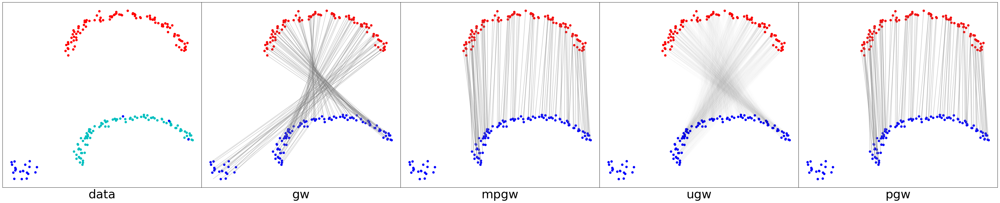

In [132]:
method=['gw','mpgw','ugw','pgw'] #['pgw'],result['mpgw'],result['ugw'],result['gw']
fig, ax = plt.subplots(1, 5, figsize=(40, 8))
threshold=1e-5

ax[0].scatter(X1[:,0], X1[:, 1], c='r')
    
ax[0].scatter(X2[0:N,0], X2[0:N,1], c='c')
ax[0].scatter(X2[N+1:,0],  X2[N+1:,1], c='b')
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].set_xlabel('data', fontsize=35)

for idx,method in enumerate(method):
    idx=idx+1
    result_list=result[method]
    gamma=result_list[-1]
    if method=='ugw':
        gamma=result_list[1]

    N=X1.shape[0]
    ax[idx].scatter(X1[:,0], X1[:, 1], c='r')
    
    ax[idx].scatter(X2[0:N,0], X2[0:N,1], c='b')
    ax[idx].scatter(X2[N+1:,0],  X2[N+1:,1], c='b')
    ax[idx].set_xticks([])
    ax[idx].set_yticks([])
    ax[idx].set_xlabel(method, fontsize=35)
    for i in range(X1.shape[0]):
        for j in range(X2.shape[0]):
            if gamma[i, j] > threshold:  ax[idx].plot([X1[i, 0], X2[j, 0]], [X1[i, 1], X2[j, 1]], 'grey', lw=gamma[i, j]*150, alpha=0.4)

plt.tight_layout(pad=0.0)
plt.savefig('2d_shape_matching/2D_shape.png', dpi=200,bbox_inches='tight')
plt.savefig('2d_shape_matching/2D_shape.pdf', dpi=200,bbox_inches='tight')
    
plt.show()


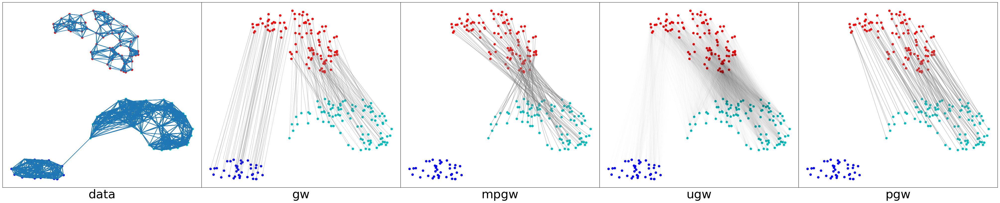

In [114]:
method=['gw','mpgw','ugw','pgw'] #['pgw'],result['mpgw'],result['ugw'],result['gw']
fig, ax = plt.subplots(1, 5, figsize=(40, 8))
threshold=1e-5

ax[0].scatter(X1[:,0], X1[:, 1], c='r')
    
ax[0].scatter(X2[0:N,0], X2[0:N,1], c='c')
ax[0].scatter(X2[N+1:,0],  X2[N+1:,1], c='b')
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].set_xlabel('data', fontsize=35)

for i in knnG1.indices:
    for j in knnG1[i].indices:
        ax[0].plot([X1[i,0], X1[j,0]], [X1[i,1],X1[j,1]],c='C0',alpha=.5)


for i in knnG2.indices:
    for j in knnG2[i].indices:
        ax[0].plot([X2[i,0], X2[j,0]], [X2[i,1],X2[j,1]],c='C0',alpha=.5)

method_idx_list=[-1,-1,-2,-2]

for idx,(method,method_idx) in enumerate(zip(method,method_idx_list)):
    idx=idx+1
    result_list=result[method]
    gamma=result_list[method_idx]


    N=X1.shape[0]
    ax[idx].scatter(X1[:,0], X1[:, 1], c='r')
    
    ax[idx].scatter(X2[0:N,0], X2[0:N,1], c='c')
    ax[idx].scatter(X2[N+1:,0],  X2[N+1:,1], c='b')
    ax[idx].set_xticks([])
    ax[idx].set_yticks([])
    ax[idx].set_xlabel(method, fontsize=35)
    for i in range(X1.shape[0]):
        for j in range(X2.shape[0]):
            if gamma[i, j] > threshold:  ax[idx].plot([X1[i, 0], X2[j, 0]], [X1[i, 1], X2[j, 1]], 'grey', lw=gamma[i, j]*150, alpha=0.4)

plt.tight_layout(pad=0.0)
plt.savefig('2d_shape_matching/2D_shape_graph.png', dpi=200,bbox_inches='tight')
plt.savefig('2d_shape_matching/2D_shape_graph.pdf', dpi=200,bbox_inches='tight')
    
plt.show()

GW : 6.561695001734547


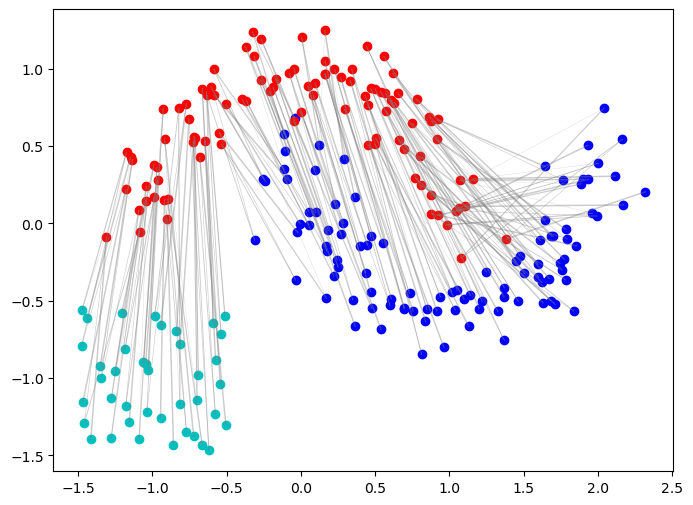

PGW lambda=0.01 for 3D: transport cost=4.037178693858962, penalty=2.220446049250313e-18, distance=4.037178693858962


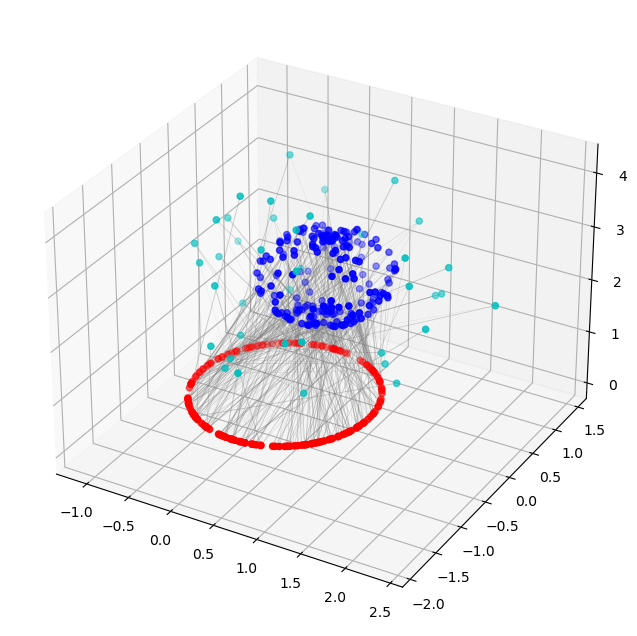

PGW lambda=0.1 for 3D: transport cost=3.9743264480737563, penalty=2.2204460492503132e-17, distance=3.9743264480737563


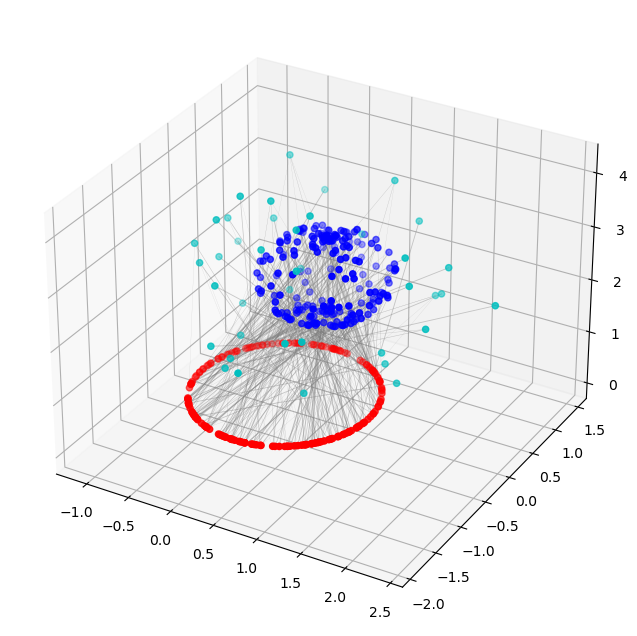

PGW lambda=1.0 for 3D: transport cost=4.042855779207127, penalty=0.016631944444443825, distance=4.0594877236515705


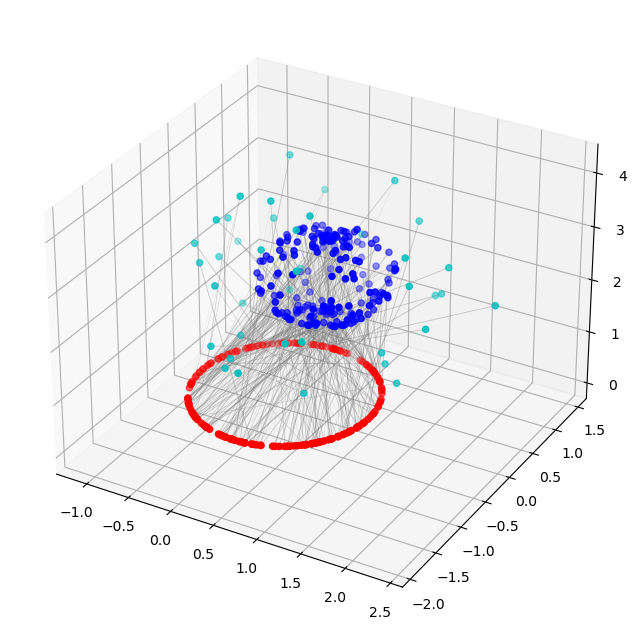

PGW lambda=10 for 3D: transport cost=2.14294366805977, penalty=-6.661338147750939e-15, distance=2.1429436680597633


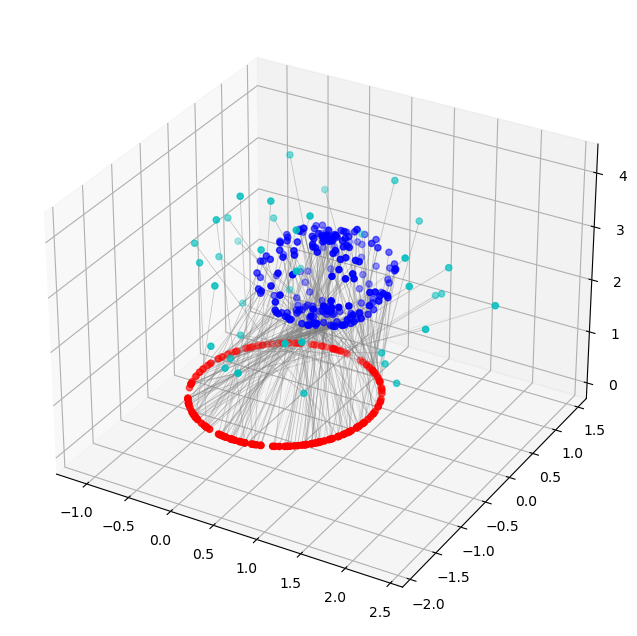

UGW  rho=0.01 for 3D: cost=0.023535054177045822


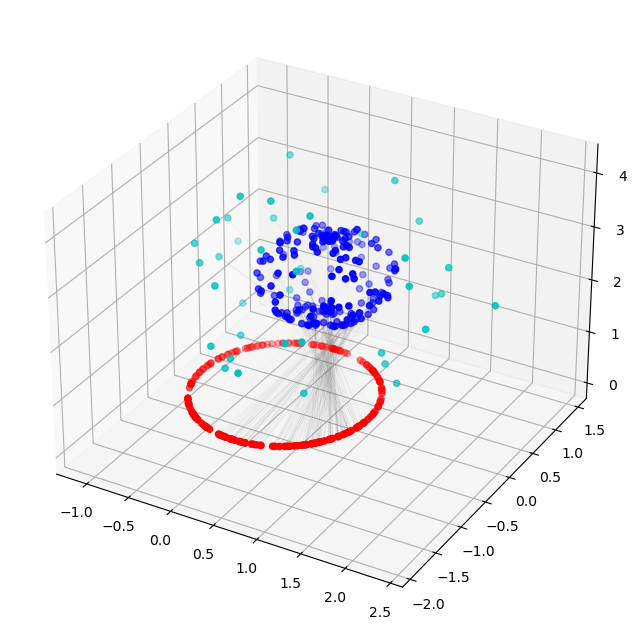

UGW  rho=0.1 for 3D: cost=0.17163732647895813


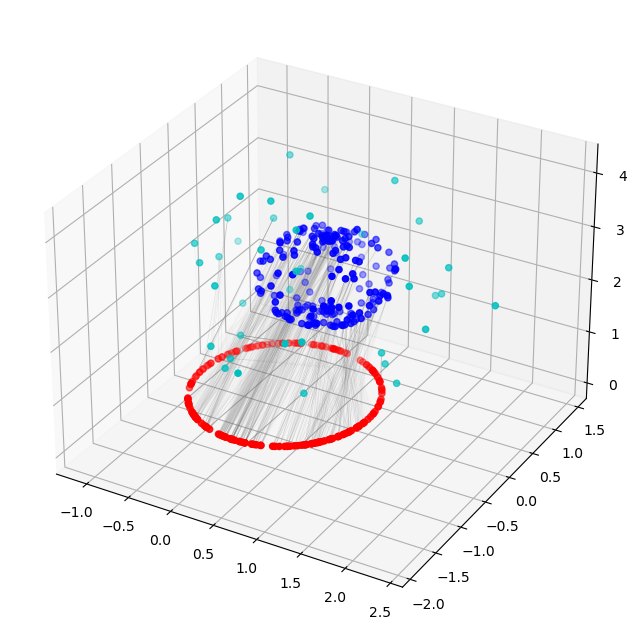

UGW  rho=1.0 for 3D: cost=0.9624838829040527


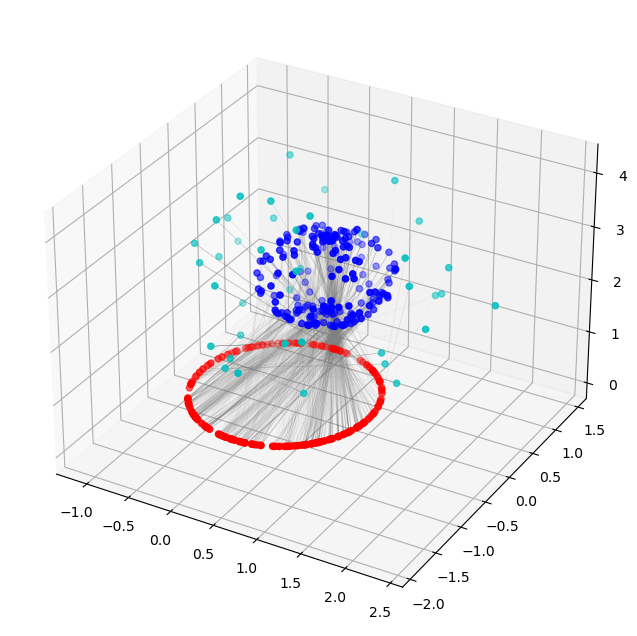

UGW  rho=10 for 3D: cost=1.9928961992263794


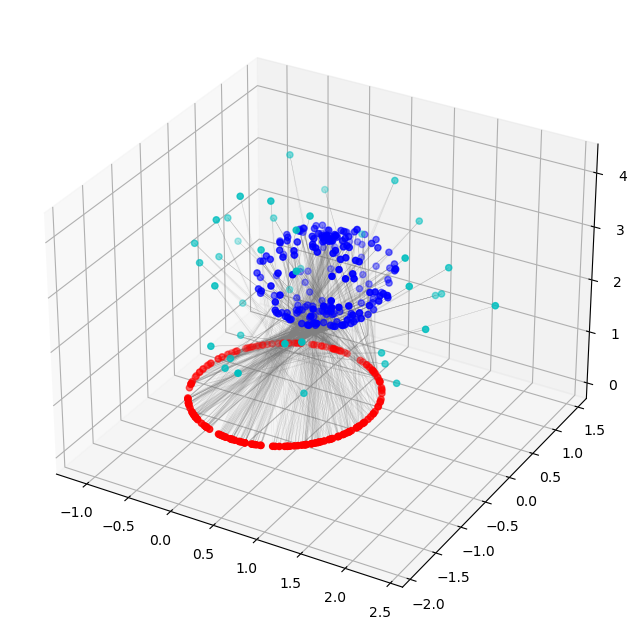

In [18]:
#GW
X_src = X_2d[y_2d != 0] 
y_src = y_2d[y_2d != 0]
X_tar = X_2d[y_2d == 0] 
p = np.ones(X_src.shape[0]) / X_src.shape[0]
q = np.ones(X_tar.shape[0]) / X_tar.shape[0]
C1, C2 = get_cost_matrices(X_src, X_tar)
gamma = gromov_wasserstein(C1, C2, p, q, G0=None, thres=1, numItermax=100*X_src.shape[0], tol=1e-5, log=False, verbose=False, line_search=False)
gw_dist = GW_dist(C1, C2, gamma)
print(f'GW : {gw_dist}')
plot_plan_2d(X_src, X_tar, gamma, y_src)


for lam in lams:
    X_src = sphere 
    labels_src = labels_3d
    X_tar = circle  
    p = np.ones(X_src.shape[0]) / X_src.shape[0]
    q = np.ones(X_tar.shape[0]) / X_tar.shape[0]
    C1, C2 = get_cost_matrices(X_src, X_tar)
    
    gamma = partial_gromov_ver1(C1, C2, p, q, G0=None, Lambda=lam, thres=1, numItermax=100*X_src.shape[0], tol=1e-5, log=False, verbose=False, line_search=False)
    pgw_trans, pgw_penalty = PGW_dist_with_penalty(C1, C2, gamma, p, q, lam)
    pgw_D = pgw_trans + pgw_penalty
    
    print(f'PGW lambda={lam} for 3D: transport cost={pgw_trans}, penalty={pgw_penalty}, distance={pgw_D}')
    plot_plan_3d(X_src, X_tar, gamma, labels_src)

for rho in rhos:
    X_src = sphere 
    labels_src = labels_3d
    X_tar = circle  
    p = np.ones(X_src.shape[0]) / X_src.shape[0]
    q = np.ones(X_tar.shape[0]) / X_tar.shape[0]
    C1, C2 = get_cost_matrices(X_src, X_tar)
    
    eps = 0.004
    Cx = torch.from_numpy(C1).to(torch.float32)
    Cy = torch.from_numpy(C2).to(torch.float32)
    mu = torch.from_numpy(p).to(torch.float32)
    nu = torch.from_numpy(q).to(torch.float32)
    gamma = log_batch_ugw_sinkhorn(mu.unsqueeze(0), Cx.unsqueeze(0), nu.unsqueeze(0), Cy.unsqueeze(0), init=None, eps=eps, rho=rho, rho2=rho, nits_plan=3000, tol_plan=1e-5, nits_sinkhorn=3000, tol_sinkhorn=1e-6)
    gamma = gamma.squeeze().detach().cpu().numpy()
    ugw_cost_value = ugw_cost(torch.tensor(gamma), torch.tensor(gamma), mu, Cx, nu, Cy, eps=eps, rho=rho, rho2=rho)
    
    print(f'UGW  rho={rho} for 3D: cost={ugw_cost_value}')
    plot_plan_3d(X_src, X_tar, gamma, labels_src)

GW for 3D: 2.14294366805977


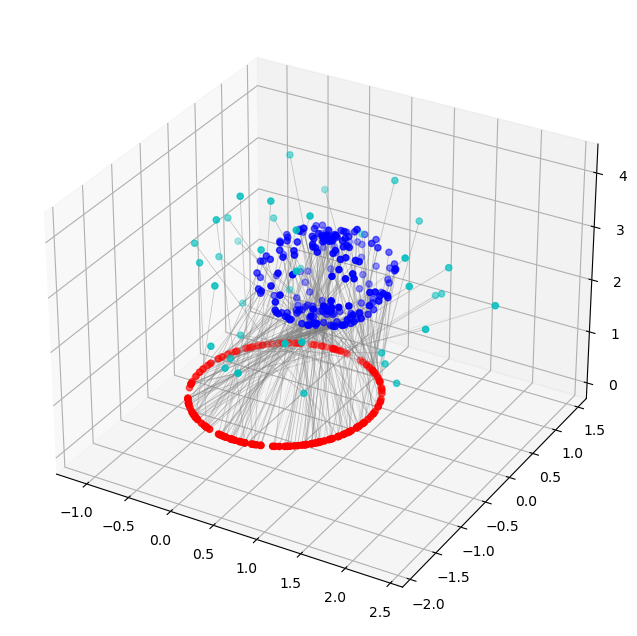

In [19]:

X_src = sphere 
labels_src = labels_3d
X_tar = circle  # Circle
p = np.ones(X_src.shape[0]) / X_src.shape[0]
q = np.ones(X_tar.shape[0]) / X_tar.shape[0]
C1, C2 = get_cost_matrices(X_src, X_tar)
gamma = gromov_wasserstein(C1, C2, p, q, G0=None, thres=1, numItermax=100*X_src.shape[0], tol=1e-5, log=False, verbose=False, line_search=False)
gw_dist = GW_dist(C1, C2, gamma)
print(f'GW for 3D: {gw_dist}')
plot_plan_3d(X_src, X_tar, gamma, labels_src)
